**IN3060/INM460 Computer Vision Coursework(PG)_Yumi Heo(230003122)**

**Face Covering Detection**

# Google Drive Setup

In [1]:
# Mount the Google Drive
# This code is derived from the lab tutorial 2
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Call the path to the dataset in the Google Drive
# This code is derived from the lab tutorial 2
import os

drive_path = '/content/drive/MyDrive/CW_Folder_PG/CW_Dataset'
dataset_path = os.path.join('drive', 'My Drive', drive_path)

# Check any file through the path
print(os.listdir(dataset_path))

['CV2024_CW_Dataset.zip', 'test']


In [3]:
# Check the python version in colab
import sys
sys.version

'3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]'

In [4]:
# Check the runtime
import torch

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Assuming that we are on a CUDA machine, this should print a CUDA device:
print(device)

cuda:0


# Data preprocessing

In [5]:
# Import packages for data preprocessing
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
from skimage.io import imread
from skimage.transform import resize
from joblib import dump, load
from sklearn import svm, metrics
import torchvision
from torchvision import datasets, models, transforms
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import TensorDataset, Dataset, DataLoader, random_split
import time
import copy
import random
random.seed(42)

# Check the version of OpenCV
cv2.__version__

'4.8.0'

## Load the dataset

In [6]:
# Unzip the dataset
# This code is derived from the lab tutorial 6

# Identify path to zipped dataset
zip_path = os.path.join(dataset_path, 'CV2024_CW_Dataset.zip')

# Copy it to Colab
!cp '{zip_path}' .

# Unzip it
!yes|unzip -q CV2024_CW_Dataset.zip

# Delete zipped version from Colab (not from Drive)
!rm CV2024_CW_Dataset.zip

## Set the training set

In [7]:
# Define the function to load images and labels
def load_images_labels(image_dir, label_dir):
    images = []
    labels = []

    # Get the image files in order
    image_files = sorted(os.listdir(image_dir))

    # Iterate over each image file
    for image_file in image_files:
        # Check the '.jpeg' extension of the image file
        if image_file.endswith('.jpeg'):
            # Load the image
            image_path = os.path.join(image_dir, image_file)
            image = io.imread(image_path)
            images.append(image)

            # Find the corresponding the name of label file to that of the image file in text files
            label_file = os.path.join(label_dir, os.path.splitext(image_file)[0] + '.txt')
            if os.path.exists(label_file):
                # Read the inside of the label file and load the label
                with open(label_file, 'r') as f:
                    label = f.read().strip()
                    labels.append(label)

    return images, labels

In [8]:
# Directory to training images and labels
image_dir = '/content/train/images'
label_dir = '/content/train/labels'

# Load images and labels
images, labels = load_images_labels(image_dir, label_dir)

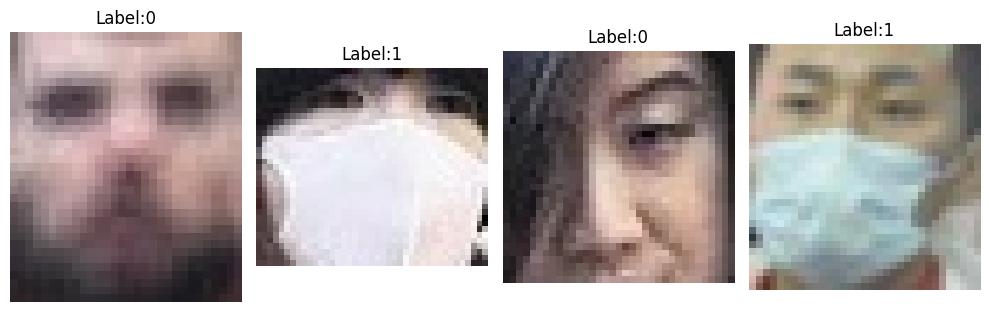

In [ ]:
# Check whether the image and label have been loaded in order correctly
fig, ax = plt.subplots(1, 4, figsize=(10, 8), sharey=True)

# Set a list of the label for the plot
plot_labels = []

for i in range(4):
    # Change labels to strings and append them to a new list
    plot_labels.append(str(labels[i]))
    # Concatenate strings for each title
    ax[i].set_title('Label:' + plot_labels[i])
    ax[i].imshow(images[i])
    ax[i].set_axis_off()

fig.tight_layout()
plt.show()

In [9]:
# Change the names of variables for training set
X_train = images
y_train = labels

## Set the test set

In [10]:
# Directory to test images and labels
image_dir = '/content/test/images'
label_dir = '/content/test/labels'

# Load images and labels
images, labels = load_images_labels(image_dir, label_dir)

In [11]:
# Change the names of variables for test set
X_test = images
y_test = labels

## Check the data type of the training and test sets

In [ ]:
# Check each number of images in the training set and the test set
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

2394
2394
458
458


In [ ]:
# Check the data type of elements in y_train and y_test
print(y_train[0:3])
print(y_test[0:3])

['0', '1', '0']
['1', '1', '1']


In [12]:
# Convert strings to float in y_train and y_test
y_train = [float(item) for item in y_train]
y_test = [float(item) for item in y_test]

In [ ]:
# Double check the data type of elements in y_train and y_test
print(y_train[0:3])
print(y_test[0:3])

[0.0, 1.0, 0.0]
[1.0, 1.0, 1.0]


## Check the first index in the training set and the test set

In [ ]:
# Check the first index of images and labels in the training set and test set
print("The first index in X_train:\n", (X_train[0]))
print("The first index in y_train:\n", (y_train[0]))
print("The first index in X_test:\n", (X_test[0]))
print("The first index in y_test:\n", (y_test[0]))

The first index in X_train:
 [[[128 114 114]
  [170 154 155]
  [196 176 178]
  ...
  [187 159 148]
  [170 143 134]
  [157 132 125]]

 [[130 116 116]
  [173 157 158]
  [198 178 180]
  ...
  [191 163 152]
  [170 143 134]
  [161 136 129]]

 [[128 112 113]
  [173 154 156]
  [199 179 181]
  ...
  [190 162 151]
  [172 145 136]
  [160 135 128]]

 ...

 [[ 44  35  38]
  [ 43  34  37]
  [ 47  38  43]
  ...
  [ 50  38  40]
  [ 60  41  45]
  [ 64  43  48]]

 [[ 40  28  32]
  [ 40  29  33]
  [ 45  34  40]
  ...
  [ 62  47  50]
  [ 68  47  52]
  [ 68  43  49]]

 [[ 46  31  36]
  [ 47  32  37]
  [ 51  36  41]
  ...
  [ 72  53  57]
  [ 76  51  55]
  [ 75  46  51]]]
The first index in y_train:
 0.0
The first index in X_test:
 [[[28 25 20]
  [38 33 27]
  [49 42 36]
  ...
  [18 22 23]
  [21 29 31]
  [15 25 26]]

 [[52 47 41]
  [55 48 40]
  [68 59 50]
  ...
  [25 29 28]
  [14 22 24]
  [21 26 29]]

 [[88 81 71]
  [87 79 68]
  [91 77 66]
  ...
  [25 27 24]
  [26 30 31]
  [24 25 29]]

 ...

 [[90 92 91]
  [

## Check the balance between the classes in the target

In [ ]:
# Check the total number of unique values in the label
nunique_labels = len(set(y_test))
nunique_labels

3

In [ ]:
# Check the histogram of the number of unique values in the training and test label
# Find the unique value in the training label
train_values = list(set(y_train))
# Count the values in the training label
train_values_counts = [y_train.count(value) for value in train_values]

# Find the unique value in the test label
test_values = list(set(y_test))
# Count the values in the test label
test_values_counts = [y_test.count(value) for value in test_values]

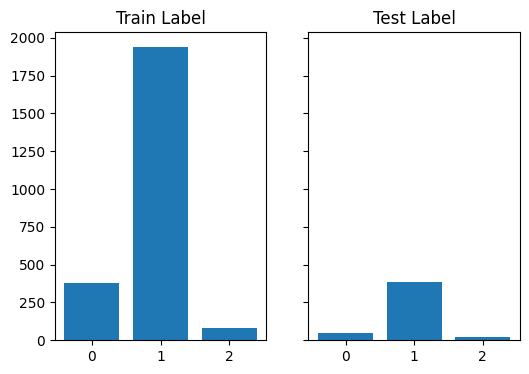

In [ ]:
# Plot histograms of the counts of unique values in both labels
fig, ax = plt.subplots(1, 2, figsize=(6, 4), sharey=True)

ax[0].bar(train_values, train_values_counts)
ax[1].bar(test_values, test_values_counts)
ax[0].set_title('Train Label')
ax[1].set_title('Test Label')
plt.show()

## Image resizing

In [ ]:
# Find the smallest size of the image in the training set

# Initialise with a positive infinity value
train_smallest_height = float('inf')
train_smallest_width = float('inf')
train_smallest_channel = float('inf')

# Iterate over all images in the training set
for image in X_train:
    # Get the dimensions of the current image
    height, width, channels = image.shape

    # Update the smallest width and height
    if height < train_smallest_height:
      train_smallest_height = height
    if width < train_smallest_width:
      train_smallest_width = width
    if channels < train_smallest_channel:
      train_smallest_channel = channels

print("The smallest height in the training set:", train_smallest_height)
print("The smallest width in the training set:", train_smallest_width)
print("The smallest channel in the training set:", train_smallest_channel)

The smallest height in the training set: 11
The smallest width in the training set: 16
The smallest channel in the training set: 3


In [ ]:
# Find the smallest size of the image in the test set

# Initialise with a positive infinity value
test_smallest_height = float('inf')
test_smallest_width = float('inf')
test_smallest_channel = float('inf')

# Iterate over all images in the training set
for image in X_test:
    # Get the dimensions of the current image
    height, width, channels = image.shape

    # Update the smallest width and height
    if height < test_smallest_height:
      test_smallest_height = height
    if width < test_smallest_width:
      test_smallest_width = width
    if channels < test_smallest_channel:
      test_smallest_channel = channels

print("The smallest height in the test set:", test_smallest_height)
print("The smallest width in the test set:", test_smallest_width)
print("The smallest channel in the test set:", test_smallest_channel)

The smallest height in the test set: 13
The smallest width in the test set: 16
The smallest channel in the test set: 3


In [ ]:
# Find the largest size of the image in the training set

# Initialise with a positive infinity value
train_largest_height = float('-inf')
train_largest_width = float('-inf')
train_largest_channel = float('-inf')

# Iterate over all images in the training set
for image in X_train:
    # Get the dimensions of the current image
    height, width, channels = image.shape

    # Update the largest width and height
    if height > train_largest_height:
      train_largest_height = height
    if width > train_largest_width:
      train_largest_width = width
    if channels > train_largest_channel:
      train_largest_channel = channels

print("The largest height in the training set:", train_largest_height)
print("The largest width in the training set:", train_largest_width)
print("The largest channel in the training set:", train_largest_channel)

The largest height in the training set: 340
The largest width in the training set: 317
The largest channel in the training set: 3


In [ ]:
# Find the largest size of the image in the test set

# Initialise with a positive infinity value
test_largest_height = float('-inf')
test_largest_width = float('-inf')
test_largest_channel = float('-inf')

# Iterate over all images in the training set
for image in X_test:
    # Get the dimensions of the current image
    height, width, channels = image.shape

    # Update the largest width and height
    if height > test_largest_height:
      test_largest_height = height
    if width > test_largest_width:
      test_largest_width = width
    if channels > test_largest_channel:
      test_largest_channel = channels

print("The largest height in the test set:", test_largest_height)
print("The largest width in the test set:", test_largest_width)
print("The largest channel in the test set:", test_largest_channel)

The largest height in the test set: 282
The largest width in the test set: 241
The largest channel in the test set: 3


In [ ]:
# Find the average size of the image in the training set

# Initialize variables to accumulate total height and width
total_height = 0
total_width = 0

# Iterate over all images in the training set
for image in X_train:
    # Get the dimensions of the current image
    height, width, channels = image.shape

    # Accumulate total height and width
    total_height += height
    total_width += width

# Calculate the average height and width
mean_height = total_height / len(X_test)
mean_width = total_width / len(X_test)

print("The average height in the training set:", mean_height)
print("The average width in the training set:", mean_width)

The average height in the training set: 232.8013100436681
The average width in the training set: 208.5131004366812


In [ ]:
# Find the mode size of the image in the training set

# Import statistics to get the mode
import statistics

# Initialize lists to store heights and widths
heights = []
widths = []

# Iterate over all images in the test set
for image in X_train:
    # Get the dimensions of the current image
    height, width, channels = image.shape

    # Append height and width to each respective list
    heights.append(height)
    widths.append(width)

# Find the mode of heights and widths
mode_height = statistics.mode(heights)
mode_width = statistics.mode(widths)

print("The mode height in the training set:", mode_height)
print("The mode width in the training set:", mode_width)

The mode height in the training set: 23
The mode width in the training set: 18


In [ ]:
# Find the average size of the image in the test set

# Initialize variables to accumulate total height and width
total_height = 0
total_width = 0

# Iterate over all images in the test set
for image in X_test:
    # Get the dimensions of the current image
    height, width, channels = image.shape

    # Accumulate total height and width
    total_height += height
    total_width += width

# Calculate the mean height and width
mean_height = total_height / len(X_test)
mean_width = total_width / len(X_test)

print("The mean height in the test set:", mean_height)
print("The mean width in the test set:", mean_width)

The mean height in the test set: 44.30786026200873
The mean width in the test set: 39.7532751091703


In [ ]:
# Find the mode size of the image in the test set

# Initialize lists to store heights and widths
heights = []
widths = []

# Iterate over all images in the test set
for image in X_test:
    # Get the dimensions of the current image
    height, width, channels = image.shape

    # Append height and width to each respective list
    heights.append(height)
    widths.append(width)

# Find the mode of heights and widths
mode_height = statistics.mode(heights)
mode_width = statistics.mode(widths)

print("The mode height in the test set:", mode_height)
print("The mode width in the test set:", mode_width)

The mode height in the test set: 20
The mode width in the test set: 22


### Resize with interpolation: INTER_LINEAR

In [13]:
# Resize the training image to 256x256 to use SVM, MLP and CNN models
# The resized training images will be compared according to each interpolation method

# Initialize a list to store resized training images with INTER_LINEAR
resized_X_train_linear = []

# Resize each image in X_train to 256x256
resize_height = 256
resize_width = 256
resize_points = (resize_width, resize_height)

for image in X_train:
    # As for interpolation: INTER_LINEAR / INTER_CUBIC / INTER_NEAREST / INTER_AREA
    resized_image = cv2.resize(image, resize_points, interpolation=cv2.INTER_LINEAR)
    resized_X_train_linear.append(resized_image)

# Convert the list of resized images to a NumPy array
resized_X_train_linear_array = np.array(resized_X_train_linear)

### Resize with interpolation: INTER_CUBIC

In [ ]:
# Initialize a list to store resized training images with INTER_CUBIC
resized_X_train_cubic = []

# Resize each image in X_train to 256x256
resize_height = 256
resize_width = 256
resize_points = (resize_width, resize_height)

for image in X_train:
    resized_image = cv2.resize(image, resize_points, interpolation=cv2.INTER_CUBIC)
    resized_X_train_cubic.append(resized_image)

# Convert the list of resized images to a NumPy array
#resized_X_train_cubic_array = np.array(resized_X_train_cubic)

### Resize with interpolation: INTER_NEAREST

In [ ]:
# Initialize a list to store resized training images with INTER_NEAREST
resized_X_train_nearest = []

# Resize each image in X_train to 256x256
resize_height = 256
resize_width = 256
resize_points = (resize_width, resize_height)

for image in X_train:
    resized_image = cv2.resize(image, resize_points, interpolation=cv2.INTER_NEAREST)
    resized_X_train_nearest.append(resized_image)

# Convert the list of resized images to a NumPy array
#resized_X_train_nearest_array = np.array(resized_X_train_nearest)

### Resize with interpolation: INTER_AREA

In [ ]:
# Initialize a list to store resized training images with INTER_AREA
resized_X_train_area = []

# Resize each image in X_train to 256x256
resize_height = 256
resize_width = 256
resize_points = (resize_width, resize_height)

for image in X_train:
    resized_image = cv2.resize(image, resize_points, interpolation=cv2.INTER_AREA)
    resized_X_train_area.append(resized_image)

# Convert the list of resized images to a NumPy array
#resized_X_train_area_array = np.array(resized_X_train_area)

### Resized training image with the label

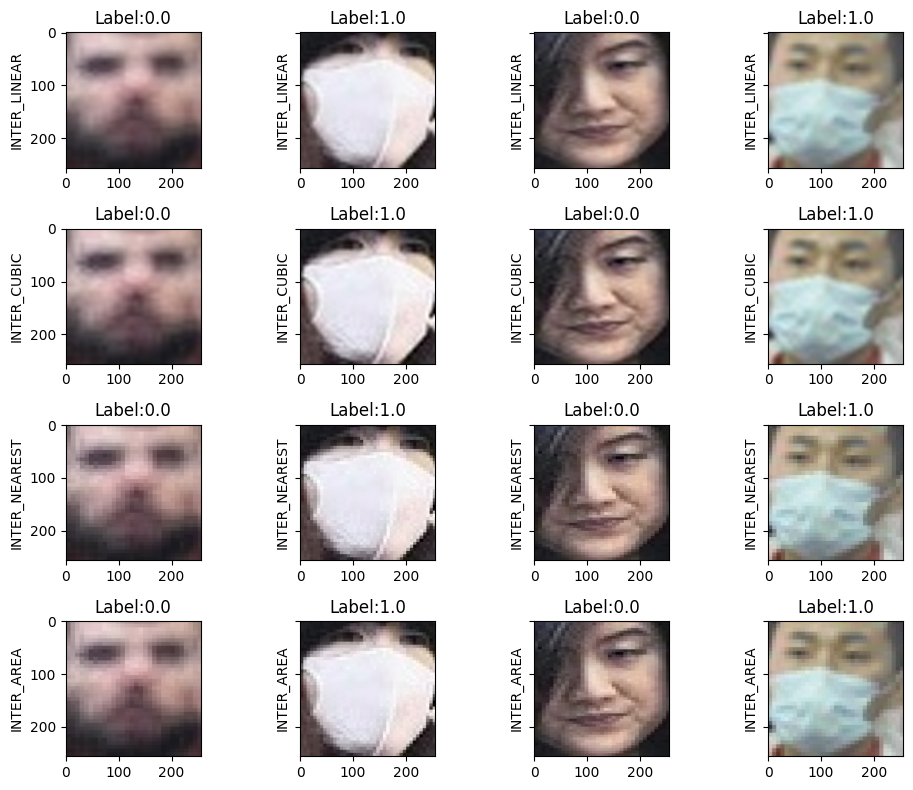

In [ ]:
# Check the resized training image with the label
fig, ax = plt.subplots(4, 4, figsize=(10, 8), sharey=True)

# Set a list of the label for the resized training image to plot
resized_plot_labels = []

for i in range(4):
    # Change labels to strings and append them to a new list
    resized_plot_labels.append(str(y_train[i]))
    # Concatenate strings for each title
    ax[0, i].set_title('Label:' + resized_plot_labels[i])
    ax[0, i].imshow(resized_X_train_linear[i])
    ax[0, i].set_ylabel('INTER_LINEAR')

    ax[1, i].set_title('Label:' + resized_plot_labels[i])
    ax[1, i].imshow(resized_X_train_cubic[i])
    ax[1, i].set_ylabel('INTER_CUBIC')

    ax[2, i].set_title('Label:' + resized_plot_labels[i])
    ax[2, i].imshow(resized_X_train_nearest[i])
    ax[2, i].set_ylabel('INTER_NEAREST')

    ax[3, i].set_title('Label:' + resized_plot_labels[i])
    ax[3, i].imshow(resized_X_train_area[i])
    ax[3, i].set_ylabel('INTER_AREA')

fig.tight_layout()
plt.show()

**Resized images with inter-linear interpolation will be used as training samples.**

## Training and Validation sets for SVM and MLP models

In [ ]:
# Print the shape and dtype of the training samples
print("Shape of the training images :", resized_X_train_linear_array[0].shape)
print("Dtype of the training images :", resized_X_train_linear_array[0].dtype)
print("Samples in the training images:", len(resized_X_train_linear_array))
print("Dtype of the training labels :", type(y_train[0]))
print("Samples in the training labels:", len(y_train))

Shape of the training images : (256, 256, 3)
Dtype of the training images : uint8
Samples in the training images: 2394
Dtype of the training labels : <class 'float'>
Samples in the training labels: 2394


In [ ]:
# Divide the training set to 80% for training and 20% for validation sets
from sklearn.model_selection import train_test_split

X_train_svm_mlp, X_val_svm_mlp, y_train_svm_mlp, y_val_svm_mlp = train_test_split(resized_X_train_linear_array, y_train, test_size=0.2, random_state=42, shuffle=True, stratify=y_train)

In [ ]:
# Print the shape and dtype of the training samples
print("Shape of the training images :", X_train_svm_mlp[0].shape)
print("Dtype of the training images :", X_train_svm_mlp[0].dtype)
print("Samples in the training images:", len(X_train_svm_mlp))
print("Dtype of the training labels :", type(y_train_svm_mlp[0]))
print("Samples in the training labels:", len(y_train_svm_mlp))

Shape of the training images : (256, 256, 3)
Dtype of the training images : uint8
Samples in the training images: 1915
Dtype of the training labels : <class 'float'>
Samples in the training labels: 1915


In [ ]:
# Print the shape and dtype of the validation samples
print("Shape of the validation images :", X_val_svm_mlp[0].shape)
print("Dtype of the validation images :", X_val_svm_mlp[0].dtype)
print("Samples in the validation images:", len(X_val_svm_mlp))
print("Dtype of the validation labels :", type(X_val_svm_mlp[0]))
print("Samples in the validation labels:", len(X_val_svm_mlp))

Shape of the validation images : (256, 256, 3)
Dtype of the validation images : uint8
Samples in the validation images: 479
Dtype of the validation labels : <class 'numpy.ndarray'>
Samples in the validation labels: 479


In [ ]:
# Print the shape and dtype of the test samples
print("Shape of the test images :", X_test[0].shape)
print("Dtype of the test images :", X_test[0].dtype)
print("Samples in the test images:", len(X_test))
print("Dtype of the test labels :", type(y_test[0]))
print("Samples in the test labels:", len(y_test))

Shape of the test images : (45, 43, 3)
Dtype of the test images : uint8
Samples in the test images: 458
Dtype of the test labels : <class 'float'>
Samples in the test labels: 458


# Model with SIFT using K-Means & SVM

## Define the SIFT

In [ ]:
# Set the SIFT detector
sift = cv2.SIFT_create()

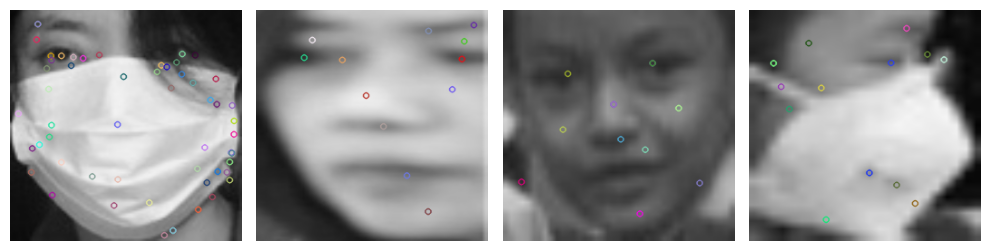

In [ ]:
# This code is derived from the lab tutorial 6
# Import the relevant libraries
from skimage import color, img_as_ubyte

# Create empty lists for feature descriptors and labels
des_list = []
sift_y_train_list = []

fig, ax = plt.subplots(1, 4, figsize=(10, 8), sharey=True)

for i in range(len(X_train_svm_mlp)):
    # Identify keypoints and extract descriptors with SIFT
    img = img_as_ubyte(color.rgb2gray(X_train_svm_mlp[i]))
    kp, des = sift.detectAndCompute(img, None)

    # Show results for first 4 images
    if i<4:
        img_with_SIFT = cv2.drawKeypoints(img, kp, img)
        ax[i].imshow(img_with_SIFT)
        ax[i].set_axis_off()

    # Append list of descriptors and label to respective lists
    if des is not None:
        des_list.append(des)
        sift_y_train_list.append(y_train_svm_mlp[i])

fig.tight_layout()
plt.show()

# Convert to array for easier handling
des_array = np.vstack(des_list)

## Apply K-means **clustering**

In [ ]:
# Perform k-means clustering on the SIFT features
from sklearn.cluster import KMeans

In [ ]:
# This code is derived from the lab tutorial 6
# Set the number of centroids/codewords
k = len(np.unique(y_train_svm_mlp)) * 10

# Define k-means
kmeans = KMeans(n_clusters=k, n_init='auto').fit(des_array)

In [ ]:
# This code is derived from the lab tutorial 6
# Convert descriptors into histograms of codewords for each image
train_hist_list = []
idx_list = []

for des in des_list:
    hist = np.zeros(k)

    idx = kmeans.predict(des)
    idx_list.append(idx)
    for j in idx:
        hist[j] = hist[j] + (1 / len(des))
    train_hist_list.append(hist)

train_hist_array = np.vstack(train_hist_list)

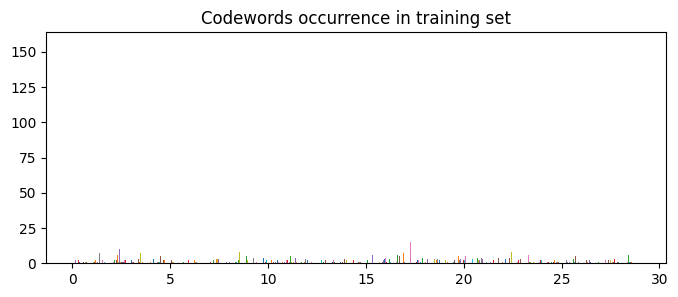

In [ ]:
# This code is derived from the lab tutorial 6
# Plot the histogram for the codewords
fig, ax = plt.subplots(figsize=(8, 3))
ax.hist(np.array(idx_list, dtype=object), bins=k)
ax.set_title('Codewords occurrence in training set')
plt.show()

## Build and train the SVM model

In [ ]:
# Set the timer
start_time = time.time()

# This code is derived from the lab tutorial 6
# Create the baseline SVM model
sift_svm_classifier = svm.SVC(kernel='rbf', class_weight='balanced')

# Train the model
sift_svm_classifier.fit(train_hist_array, sift_y_train_list)

# End the timer
end_time = time.time()

# Calculate training time
elapsed_train_time = end_time- start_time
print(f"elapsed training time: {elapsed_train_time}")

# Define the file path
siftsvm_file_path = "/content/drive/MyDrive/CW_Folder_PG/Models/sift_svm_classifier.joblib"

# Save the trained SVM model
dump(sift_svm_classifier, siftsvm_file_path)

elapsed training time: 0.2507748603820801


['/content/drive/MyDrive/CW_Folder_PG/Models/sift_svm_classifier.joblib']

In [ ]:
# Check the model
sift_svm_classifier

SVC(class_weight='balanced')

In [ ]:
print(sift_svm_classifier.class_weight_)

[ 2.13266444  0.4108677  10.28494624]


## Validation

In [ ]:
# This code is derived from the lab tutorial 6
# Get points, extract feature descriptors and append codewords to the histograms from the validation set
val_hist_list = []

for i in range(len(X_val_svm_mlp)):
    img = img_as_ubyte(color.rgb2gray(X_val_svm_mlp[i]))
    kp, des = sift.detectAndCompute(img, None)

    if des is not None:
        hist = np.zeros(k)

        idx = kmeans.predict(des)

        for j in idx:
            hist[j] = hist[j] + (1 / len(des))

        # hist = scale.transform(hist.reshape(1, -1))
        val_hist_list.append(hist)

    else:
        val_hist_list.append(None)

# Remove potential cases of images with no descriptors
idx_not_empty = [i for i, x in enumerate(val_hist_list) if x is not None]
val_hist_list = [val_hist_list[i] for i in idx_not_empty]
y_val_svm_mlp = [y_val_svm_mlp[i] for i in idx_not_empty]
val_hist_array = np.vstack(val_hist_list)

In [ ]:
# Load the saved SIFT+SVM model
sift_svm_classifier = load(siftsvm_file_path)

# Predict labels using the trained SVM model
sift_svm_y_val_pred = sift_svm_classifier.predict(val_hist_array).tolist()

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {sift_svm_classifier}:
      {metrics.classification_report(y_val_svm_mlp, sift_svm_y_val_pred)}\n""")

Classification report for classifier SVC(class_weight='balanced'):
                    precision    recall  f1-score   support

         0.0       0.41      0.64      0.50        75
         1.0       0.92      0.74      0.82       388
         2.0       0.08      0.25      0.12        16

    accuracy                           0.71       479
   macro avg       0.47      0.54      0.48       479
weighted avg       0.81      0.71      0.75       479




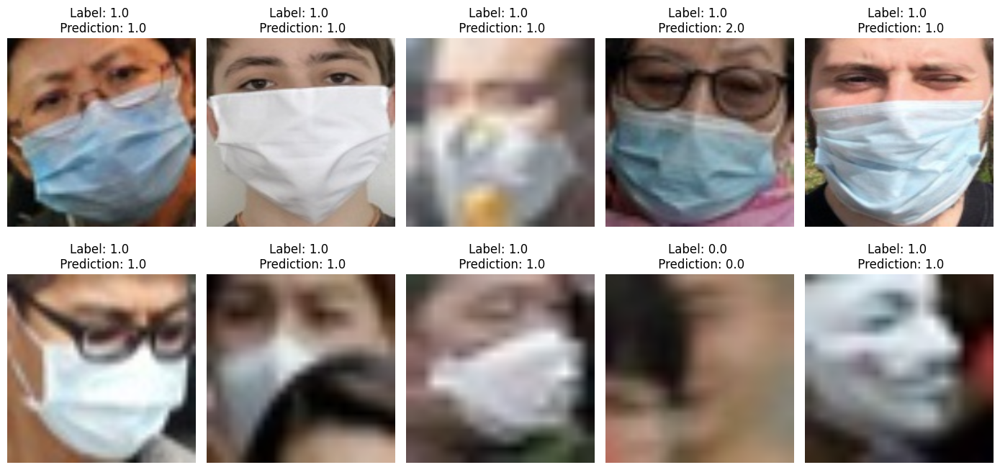

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(X_val_svm_mlp[i])
    ax[i].set_title(f'Label: {y_val_svm_mlp[i]} \n Prediction: {sift_svm_y_val_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

## Test

In [ ]:
# Import the library to resize the train image for the SVM model with SIFT
from skimage.transform import resize

# Define the resizng size
target_size = (256, 256)

# List to store resized images
resized_X_test_siftsvm = []

# Resize images in the test set
for image in X_test:
    resized_image = resize(image, target_size, anti_aliasing=True) # To make sure antialiasing for bilinear or bicubic modes
    resized_X_test_siftsvm.append(resized_image)

# This code is derived from the lab tutorial 6
# Get points, extract feature descriptors and append codewords to the histograms from the test set
test_hist_list = []

for i in range(len(resized_X_test_siftsvm)):
    img = img_as_ubyte(color.rgb2gray(X_test[i]))
    kp, des = sift.detectAndCompute(img, None)

    if des is not None:
        hist = np.zeros(k)

        idx = kmeans.predict(des)

        for j in idx:
            hist[j] = hist[j] + (1 / len(des))

        # hist = scale.transform(hist.reshape(1, -1))
        test_hist_list.append(hist)

    else:
        test_hist_list.append(None)

# Remove potential cases of images with no descriptors
idx_not_empty = [i for i, x in enumerate(test_hist_list) if x is not None]
test_hist_list = [test_hist_list[i] for i in idx_not_empty]
y_test_not_empty = [y_test[i] for i in idx_not_empty]
test_hist_array = np.vstack(test_hist_list)

In [ ]:
# Set the timer
start_time = time.time()

# Predict labels using the trained SVM model
sift_svm_y_test_pred = sift_svm_classifier.predict(test_hist_array).tolist()

# End the timer
end_time = time.time()

# Calculate test time
elapsed_test_time = end_time- start_time
print(f"elapsed test time: {elapsed_test_time}")

elapsed test time: 0.16432690620422363


In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {sift_svm_classifier}:
      {metrics.classification_report(y_test_not_empty, sift_svm_y_test_pred)}\n""")

Classification report for classifier SVC(class_weight='balanced'):
                    precision    recall  f1-score   support

         0.0       0.26      0.72      0.38        50
         1.0       0.93      0.67      0.78       384
         2.0       0.09      0.16      0.11        19

    accuracy                           0.66       453
   macro avg       0.42      0.52      0.42       453
weighted avg       0.82      0.66      0.71       453




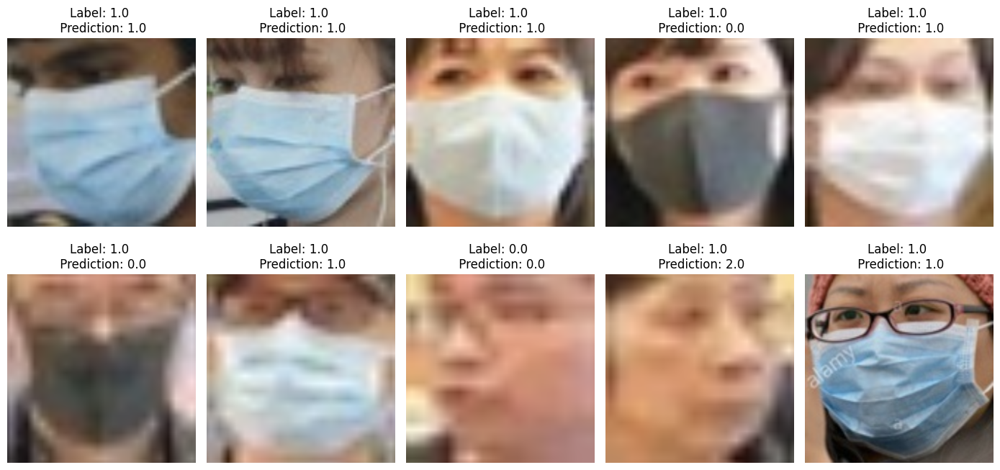

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(resized_X_test_siftsvm[i])
    ax[i].set_title(f'Label: {y_test_not_empty[i]} \n Prediction: {sift_svm_y_test_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

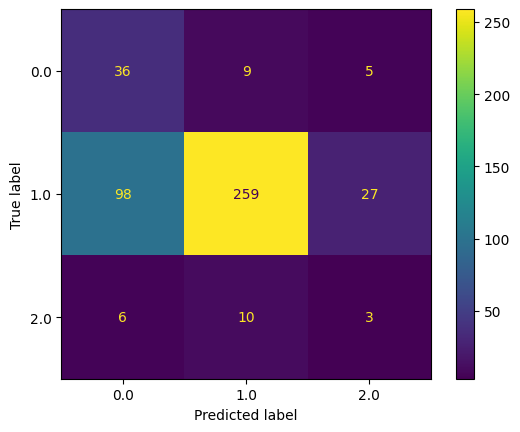

In [ ]:
# Show the confusion matrix
metrics.ConfusionMatrixDisplay.from_predictions(y_test_not_empty, sift_svm_y_test_pred)
plt.show()

## Hyperparameter tuning: Grid search

### Parameters: regularisation C / gamma / kernel

In [ ]:
from sklearn.model_selection import GridSearchCV
import itertools

In [ ]:
# Set the timer
start_time = time.time()

# Create the SVM model for grid search
gridsearch_svm = svm.SVC(kernel='rbf', class_weight='balanced')

# Perform grid search with cross-validation to tune hyperparameters
param_grid = {
    'C': [0.1, 1.0, 10.0],
    'gamma': [0.01, 0.1, 1.0],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
    }

for C, gamma, kernel in itertools.product(param_grid['C'], param_grid['gamma'], param_grid['kernel']):
    print(f"Training model with C: {C}, gamma: {gamma}, kernel: {kernel}")
    grid_search = GridSearchCV(sift_svm_classifier, param_grid, cv=3, scoring='accuracy')
    grid_search.fit(train_hist_array, sift_y_train_list)

# Get the best parameters and best accuracy
best_params = grid_search.best_params_
best_accuracy = grid_search.best_score_

# End the timer
end_time = time.time()

# Calculate the elapsed time
elapsed_gridsearch = end_time - start_time

print("Best Parameters:", best_params)
print("Best Accuracy:", best_accuracy)
print(f"Elapsed grid search time: {elapsed_gridsearch}")

Training model with C: 0.1, gamma: 0.01, kernel: linear
Training model with C: 0.1, gamma: 0.01, kernel: poly
Training model with C: 0.1, gamma: 0.01, kernel: rbf
Training model with C: 0.1, gamma: 0.01, kernel: sigmoid
Training model with C: 0.1, gamma: 0.1, kernel: linear
Training model with C: 0.1, gamma: 0.1, kernel: poly
Training model with C: 0.1, gamma: 0.1, kernel: rbf
Training model with C: 0.1, gamma: 0.1, kernel: sigmoid
Training model with C: 0.1, gamma: 1.0, kernel: linear
Training model with C: 0.1, gamma: 1.0, kernel: poly
Training model with C: 0.1, gamma: 1.0, kernel: rbf
Training model with C: 0.1, gamma: 1.0, kernel: sigmoid
Training model with C: 1.0, gamma: 0.01, kernel: linear
Training model with C: 1.0, gamma: 0.01, kernel: poly
Training model with C: 1.0, gamma: 0.01, kernel: rbf
Training model with C: 1.0, gamma: 0.01, kernel: sigmoid
Training model with C: 1.0, gamma: 0.1, kernel: linear
Training model with C: 1.0, gamma: 0.1, kernel: poly
Training model with 

## Training the revised SVM model

In [ ]:
# Set the timer
start_time = time.time()

# This code is derived from the lab tutorial 6
# Create the baseline SVM model
revised_sift_svm_classifier = svm.SVC(kernel='rbf', class_weight='balanced', C=10.0, gamma=1.0)

# Train the model
revised_sift_svm_classifier.fit(train_hist_array, sift_y_train_list)

# End the timer
end_time = time.time()

# Calculate training time
elapsed_train_time = end_time - start_time
print(f"Elapsed training time: {elapsed_train_time}")

# Define the file path
re_siftsvm_file_path = "/content/drive/MyDrive/CW_Folder_PG/Models/re_sift_svm_model.joblib"

# Save the trained SVM model
dump(revised_sift_svm_classifier, re_siftsvm_file_path)

Elapsed training time: 0.425609827041626


['/content/drive/MyDrive/CW_Folder_PG/Models/re_sift_svm_model.joblib']

## Validation

In [ ]:
# Load the revised SIFT+SVM model
revised_sift_svm_classifier = load(re_siftsvm_file_path)

# Predict labels using the trained SVM model
sift_svm_y_val_pred = revised_sift_svm_classifier.predict(val_hist_array).tolist()

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {revised_sift_svm_classifier}:
      {metrics.classification_report(y_val_svm_mlp, sift_svm_y_val_pred)}\n""")

Classification report for classifier SVC(C=10.0, class_weight='balanced', gamma=1.0):
                    precision    recall  f1-score   support

         0.0       0.39      0.52      0.44        75
         1.0       0.94      0.66      0.77       388
         2.0       0.06      0.38      0.10        16

    accuracy                           0.63       479
   macro avg       0.46      0.52      0.44       479
weighted avg       0.82      0.63      0.70       479




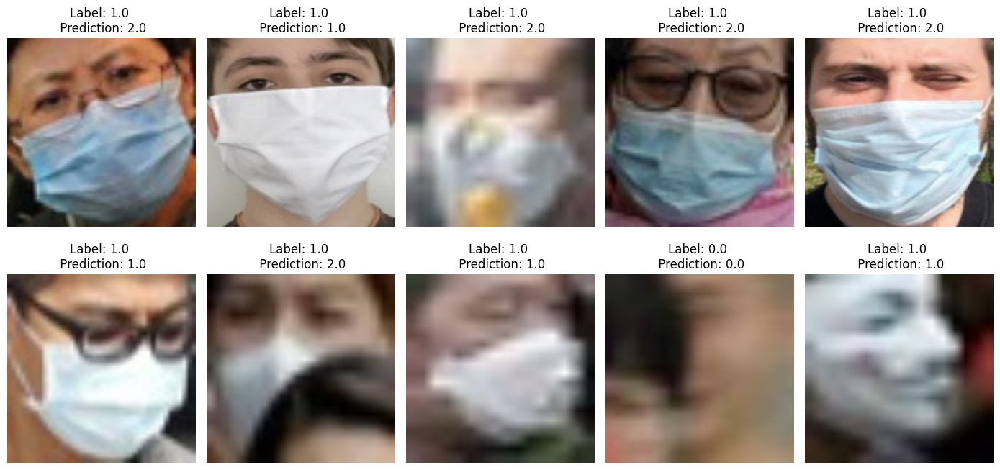

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(X_val_svm_mlp[i])
    ax[i].set_title(f'Label: {y_val_svm_mlp[i]} \n Prediction: {sift_svm_y_val_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

## Test

In [ ]:
# Set the timer
start_time = time.time()

# Predict labels using the trained SVM model
sift_svm_y_test_pred = revised_sift_svm_classifier.predict(test_hist_array).tolist()

# End the timer
end_time = time.time()

# Calculate test time
elapsed_test_time = end_time- start_time
print(f"elapsed test time: {elapsed_test_time}")

elapsed test time: 0.0965731143951416


In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {revised_sift_svm_classifier}:
      {metrics.classification_report(y_test_not_empty, sift_svm_y_test_pred)}\n""")

Classification report for classifier SVC(C=10.0, class_weight='balanced', gamma=1.0):
                    precision    recall  f1-score   support

         0.0       0.24      0.60      0.35        50
         1.0       0.93      0.62      0.74       384
         2.0       0.07      0.26      0.11        19

    accuracy                           0.60       453
   macro avg       0.41      0.49      0.40       453
weighted avg       0.82      0.60      0.67       453




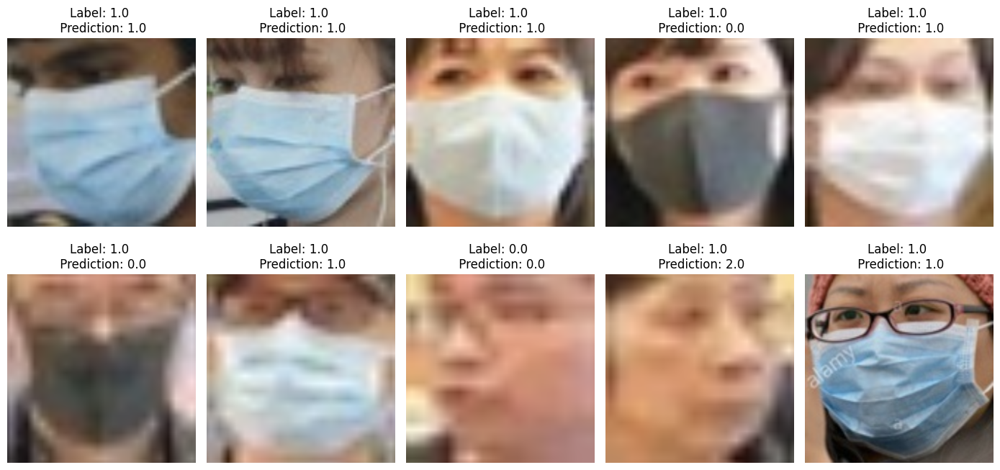

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(resized_X_test_siftsvm[i])
    ax[i].set_title(f'Label: {y_test_not_empty[i]} \n Prediction: {sift_svm_y_test_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

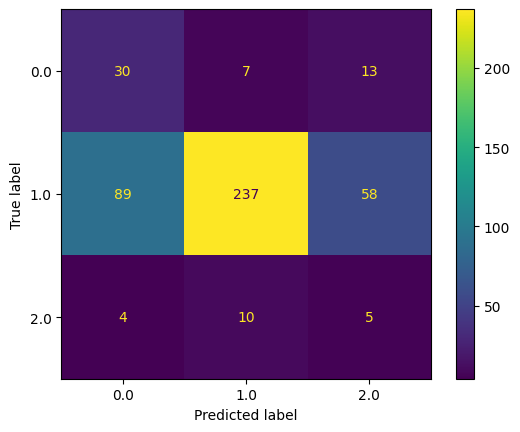

In [ ]:
# Show the confusion matrix
metrics.ConfusionMatrixDisplay.from_predictions(y_test_not_empty, sift_svm_y_test_pred)
plt.show()

# Model with HOG & SVM

## Extract HOGs

In [ ]:
# This code is derived from the lab tutorial 5
# Import libraries
from skimage.feature import hog
from skimage import color

# Define HOG parameters
orientations = 8
pixels_per_cell = (16, 16)
cells_per_block = (1, 1)

# Lists to store HOG features and labels
train_hog_features_list = []
train_hog_image_list = []
hog_y_train_list = []

for i in range(len(X_train_svm_mlp)):
    # Get HOG features for the image
    img = color.rgb2gray(X_train_svm_mlp[i])
    hog_features, hog_images = hog(img, orientations=orientations, pixels_per_cell=pixels_per_cell, cells_per_block=cells_per_block, visualize=True)

    # Append HOG features and label to respective lists
    train_hog_features_list.append(hog_features)
    train_hog_image_list.append(hog_images)
    hog_y_train_list.append(y_train_svm_mlp[i])

# Convert to array for easier handling
train_hog_features_array = np.vstack(train_hog_features_list)

In [ ]:
# This code is derived from the lab tutorial 5
# Check the number of samples and the HOG descriptor vector
print('HOG descriptor shape =', train_hog_features_array.shape)

HOG descriptor shape = (1915, 2048)


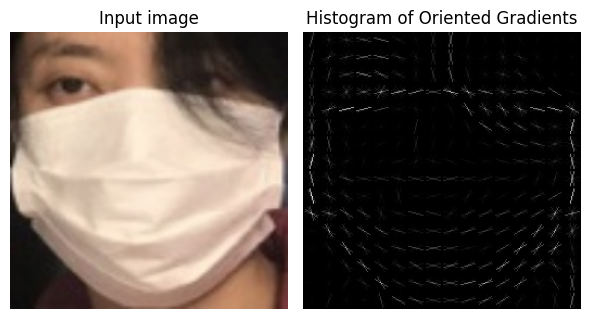

In [ ]:
# This code is derived from the lab tutorial 5
# Import the library to visualise
from skimage import exposure

# Plot the input image and its corresponding HOG
fig, ax = plt.subplots(1, 2, figsize=(6, 4), sharex=True, sharey=True)

# Plot input image
ax[0].axis('off')
ax[0].imshow(X_train_svm_mlp[0])
ax[0].set_title('Input image')

# Plot HOG image
train_hog_image_rescaled = exposure.rescale_intensity(train_hog_image_list[0], in_range=(0, 10))  # Rescale HOG image for better display
ax[1].axis('off')
ax[1].imshow(train_hog_image_rescaled, cmap='gray')
ax[1].set_title('Histogram of Oriented Gradients')

fig.tight_layout()
plt.show()

## Build and train the SVM model

In [ ]:
# Set the timer
start_time = time.time()

# This code is derived from the lab tutorial 6
# Create the SVM model
hog_svm_classifier = svm.SVC(kernel='rbf', class_weight='balanced')

# Train the model
hog_svm_classifier.fit(train_hog_features_array, hog_y_train_list)

# End the timer
end_time = time.time()

# Calculate training time
elapsed_training_time = end_time- start_time
print(f"elapsed training time: {elapsed_training_time}")

# Define the file path
hogsvm_file_path = "/content/drive/MyDrive/CW_Folder_PG/Models/hogsvm_model.joblib"

# Save the trained SVM model
dump(hog_svm_classifier, hogsvm_file_path)

elapsed training time: 5.873778343200684


['/content/drive/MyDrive/CW_Folder_PG/Models/hogsvm_model.joblib']

## Validation

In [ ]:
# Extract HOG features from the validation dataset
hog_features_val_list = []

for i in range(len(X_val_svm_mlp)):
    img = color.rgb2gray(X_val_svm_mlp[i])
    hog_features_val = hog(img, orientations=orientations, pixels_per_cell=pixels_per_cell, cells_per_block=cells_per_block)
    hog_features_val_list.append(hog_features_val)

# Convert to array
hog_features_val_array = np.vstack(hog_features_val_list)

In [ ]:
# Load the HOG+SVM model
hog_svm_classifier = load(hogsvm_file_path)

# Predict labels using the trained SVM model
hog_svm_y_val_pred = hog_svm_classifier.predict(hog_features_val_array)

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {hog_svm_classifier}:
      {metrics.classification_report(y_val_svm_mlp, hog_svm_y_val_pred)}\n""")

Classification report for classifier SVC(class_weight='balanced'):
                    precision    recall  f1-score   support

         0.0       0.56      0.61      0.59        75
         1.0       0.90      0.93      0.91       388
         2.0       0.00      0.00      0.00        16

    accuracy                           0.85       479
   macro avg       0.49      0.51      0.50       479
weighted avg       0.82      0.85      0.83       479




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


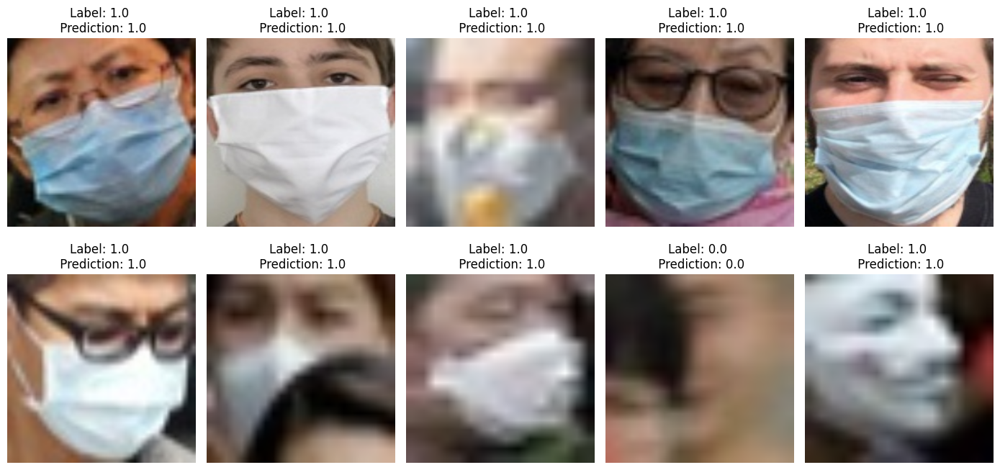

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(X_val_svm_mlp[i])
    ax[i].set_title(f'Label: {y_val_svm_mlp[i]} \n Prediction: {hog_svm_y_val_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

## Test

In [ ]:
# Define the resizng size
target_size = (256, 256)

# List to store resized images
resized_X_test_hogsvm = []

# Resize images in the test set
for image in X_test:
    resized_image = resize(image, target_size, anti_aliasing=True) # To make sure antialiasing for bilinear or bicubic modes
    resized_X_test_hogsvm.append(resized_image)

# Extract HOG features
hog_features_test_list = []
for img in resized_X_test_hogsvm:
    img_gray = color.rgb2gray(img)
    hog_features_test = hog(img_gray, orientations=orientations, pixels_per_cell=pixels_per_cell, cells_per_block=cells_per_block)
    hog_features_test_list.append(hog_features_test)

# Convert to array
hog_features_test_array = np.vstack(hog_features_test_list)

In [ ]:
# Set the timer
start_time = time.time()

# Predict labels using the trained SVM model
hog_svm_y_test_pred = hog_svm_classifier.predict(hog_features_test_array)

# End the timer
end_time = time.time()

# Calculate test time
elapsed_test_time = end_time- start_time
print(f"elapsed test time: {elapsed_test_time}")

elapsed test time: 1.4856605529785156


In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {hog_svm_classifier}:
      {metrics.classification_report(y_test, hog_svm_y_test_pred)}\n""")

Classification report for classifier SVC(class_weight='balanced'):
                    precision    recall  f1-score   support

         0.0       0.39      0.57      0.46        51
         1.0       0.91      0.90      0.90       388
         2.0       0.00      0.00      0.00        19

    accuracy                           0.82       458
   macro avg       0.43      0.49      0.46       458
weighted avg       0.81      0.82      0.82       458




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


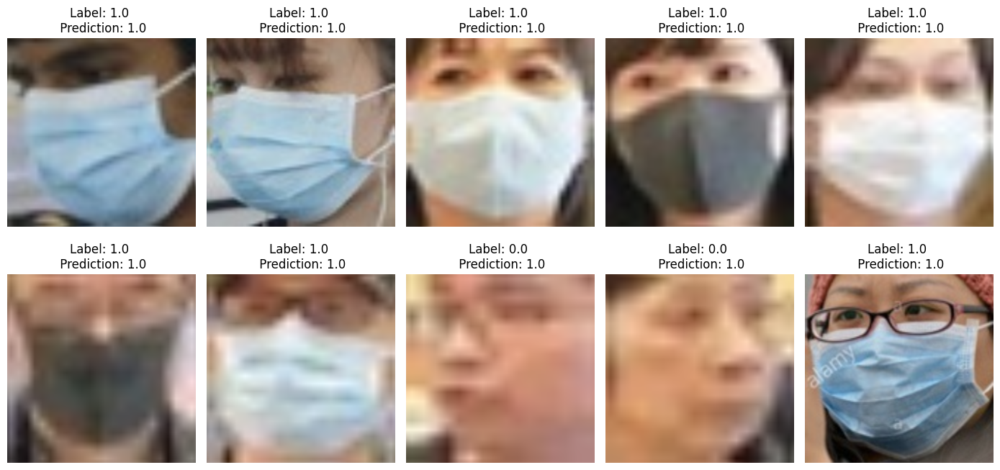

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(resized_X_test_hogsvm[i])
    ax[i].set_title(f'Label: {y_test[i]} \n Prediction: {hog_svm_y_test_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

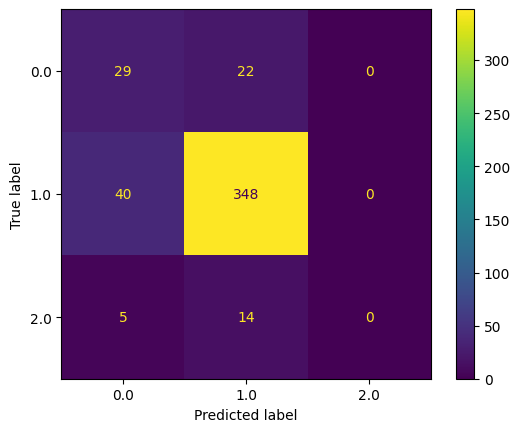

In [ ]:
# Show the confusion matrix
metrics.ConfusionMatrixDisplay.from_predictions(y_test, hog_svm_y_test_pred)
plt.show()

## Hyperparameter tuning: Grid search

### Parameters: regularisation C / gamma / kernel

In [ ]:
# Set the timer
start_time = time.time()

# Create the SVM model for grid search
gridsearch_svm = svm.SVC(kernel='rbf', class_weight='balanced')

# Perform grid search with cross-validation to tune hyperparameters
param_grid = {
    'C': [0.1, 1.0, 10.0],
    'gamma': [0.01, 0.1, 1.0],
    'kernel': ['rbf'] # As the RBF kernel was selected during the grid search for the SIFT+SVM model, we will use this kernel here too
    }

for C, gamma, kernel in itertools.product(param_grid['C'], param_grid['gamma'], param_grid['kernel']):
    print(f"Training model with C: {C}, gamma: {gamma}, kernel: {kernel}")
    grid_search = GridSearchCV(gridsearch_svm, param_grid, cv=3, scoring='accuracy')
    grid_search.fit(train_hog_features_array, hog_y_train_list)

# Get the best parameters and best accuracy
best_params = grid_search.best_params_
best_accuracy = grid_search.best_score_

# End the timer
end_time = time.time()

# Calculate the elapsed time
elapsed_gridsearch = end_time - start_time

print("Best Parameters:", best_params)
print("Best Accuracy:", best_accuracy)
print(f"Elapsed grid search time: {elapsed_gridsearch}")

Training model with C: 0.1, gamma: 0.01, kernel: rbf
Training model with C: 0.1, gamma: 0.1, kernel: rbf
Training model with C: 0.1, gamma: 1.0, kernel: rbf
Training model with C: 1.0, gamma: 0.01, kernel: rbf
Training model with C: 1.0, gamma: 0.1, kernel: rbf
Training model with C: 1.0, gamma: 1.0, kernel: rbf
Training model with C: 10.0, gamma: 0.01, kernel: rbf
Training model with C: 10.0, gamma: 0.1, kernel: rbf
Training model with C: 10.0, gamma: 1.0, kernel: rbf
Best Parameters: {'C': 10.0, 'gamma': 0.01, 'kernel': 'rbf'}
Best Accuracy: 0.8600584115397133
Elapsed grid search time: 1713608213.5390513


## Training the revised SVM model

In [ ]:
# Set the timer
start_time = time.time()

# This code is derived from the lab tutorial 6
# Create the baseline SVM model
revised_hog_svm_classifier = svm.SVC(kernel='rbf', class_weight='balanced', C=10.0, gamma=1.0)

# Train the model
revised_hog_svm_classifier.fit(train_hog_features_array, hog_y_train_list)

# End the timer
end_time = time.time()

# Calculate training time
elapsed_train_time = end_time- start_time
print(f"elapsed training time: {elapsed_train_time}")

# Define the file path
re_hogsvm_file_path = "/content/drive/MyDrive/CW_Folder_PG/Models/re_hogsvm_model.joblib"

# Save the trained SVM model to disk
dump(revised_hog_svm_classifier, re_hogsvm_file_path)

elapsed training time: 16.222405672073364


['/content/drive/MyDrive/CW_Folder_PG/Models/re_hogsvm_model.joblib']

## Validation

In [ ]:
# Load the revised HOG+SVM model
revised_hog_svm_classifier = load(re_hogsvm_file_path)

# Predict labels using the trained SVM model
hog_svm_y_val_pred = revised_hog_svm_classifier.predict(hog_features_val_array)

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {revised_hog_svm_classifier}:
      {metrics.classification_report(y_val_svm_mlp, hog_svm_y_val_pred)}\n""")

Classification report for classifier SVC(C=10.0, class_weight='balanced', gamma=1.0):
                    precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        75
         1.0       0.81      1.00      0.90       388
         2.0       0.00      0.00      0.00        16

    accuracy                           0.81       479
   macro avg       0.27      0.33      0.30       479
weighted avg       0.66      0.81      0.73       479




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


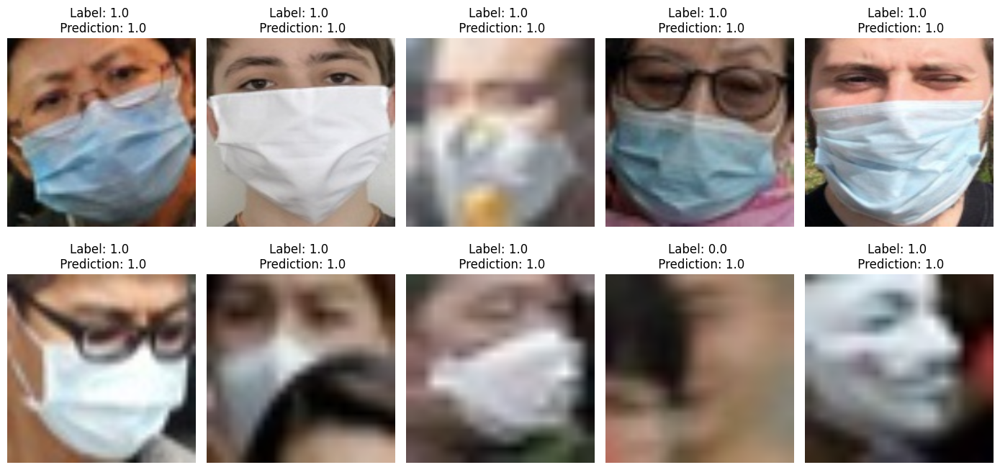

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(X_val_svm_mlp[i])
    ax[i].set_title(f'Label: {y_val_svm_mlp[i]} \n Prediction: {hog_svm_y_val_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

## Test

In [ ]:
# Set the timer
start_time = time.time()

# Predict labels using the trained SVM model
hog_svm_y_test_pred = revised_hog_svm_classifier.predict(hog_features_test_array)

# End the timer
end_time = time.time()

# Calculate test time
elapsed_test_time = end_time- start_time
print(f"elapsed test time: {elapsed_test_time}")

elapsed test time: 3.287484645843506


In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {revised_hog_svm_classifier}:
      {metrics.classification_report(y_test, hog_svm_y_test_pred)}\n""")

Classification report for classifier SVC(C=10.0, class_weight='balanced', gamma=1.0):
                    precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        51
         1.0       0.85      1.00      0.92       388
         2.0       0.00      0.00      0.00        19

    accuracy                           0.85       458
   macro avg       0.28      0.33      0.31       458
weighted avg       0.72      0.85      0.78       458




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


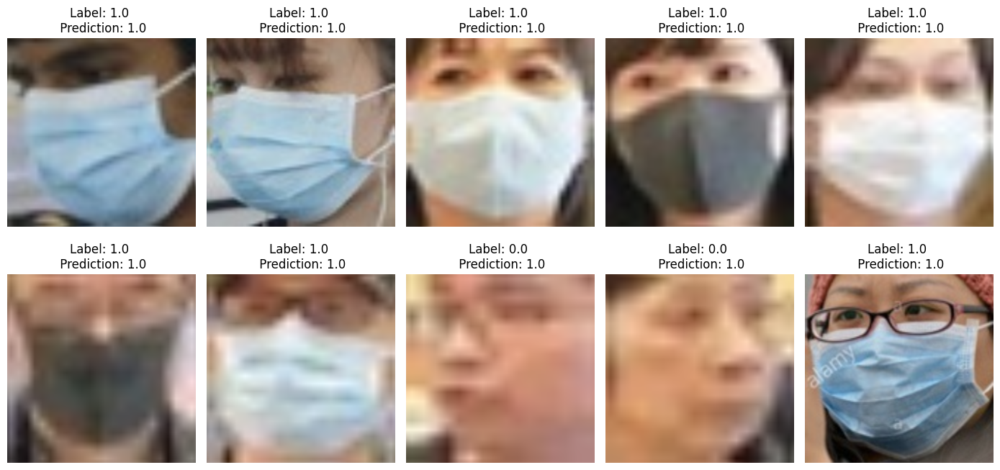

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(resized_X_test_hogsvm[i])
    ax[i].set_title(f'Label: {y_test[i]} \n Prediction: {hog_svm_y_test_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

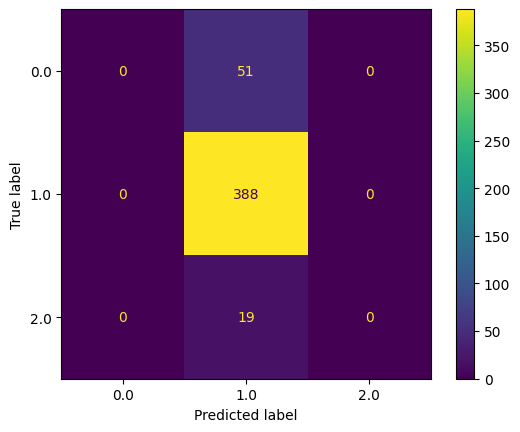

In [ ]:
# Show the confusion matrix
metrics.ConfusionMatrixDisplay.from_predictions(y_test, hog_svm_y_test_pred)
plt.show()

# Model with HOG & MLP

## Train the MLP model (a single layer)

In [ ]:
# Import the library
from sklearn.neural_network import MLPClassifier

# This code is derived from the lab tutorial 6
# Create a baseline of Multilayer Perceptrons model
hog_mlp_classifier = MLPClassifier(hidden_layer_sizes=(50,), alpha=1e-4,
                    solver='sgd', verbose=True, random_state=42,
                    learning_rate_init=.1,
                    early_stopping=True)

In [ ]:
# Set the timer
start_time = time.time()

# Train the model
hog_mlp_classifier.fit(train_hog_features_array, hog_y_train_list)

# End the timer
end_time = time.time()

# Calculate training time
elapsed_train_time = end_time- start_time
print(f"elapsed training time: {elapsed_train_time}")

# Define the file path
hogmlp_file_path = "/content/drive/MyDrive/CW_Folder_PG/Models/hogmlp_model.joblibb"

# Save the trained MLP classifier to disk
dump(hog_mlp_classifier, hogmlp_file_path)

Iteration 1, loss = 2.32053283
Validation score: 0.817708
Iteration 2, loss = 0.58645598
Validation score: 0.817708
Iteration 3, loss = 0.51101343
Validation score: 0.807292
Iteration 4, loss = 0.60897143
Validation score: 0.817708
Iteration 5, loss = 0.48244685
Validation score: 0.817708
Iteration 6, loss = 0.48719451
Validation score: 0.817708
Iteration 7, loss = 0.43777197
Validation score: 0.817708
Iteration 8, loss = 0.41622870
Validation score: 0.697917
Iteration 9, loss = 0.38203189
Validation score: 0.817708
Iteration 10, loss = 0.38041510
Validation score: 0.854167
Iteration 11, loss = 0.35892839
Validation score: 0.838542
Iteration 12, loss = 0.33846300
Validation score: 0.822917
Iteration 13, loss = 0.29886311
Validation score: 0.854167
Iteration 14, loss = 0.28782671
Validation score: 0.854167
Iteration 15, loss = 0.22036689
Validation score: 0.833333
Iteration 16, loss = 0.38087540
Validation score: 0.812500
Iteration 17, loss = 0.21434387
Validation score: 0.802083
Iterat

['/content/drive/MyDrive/CW_Folder_PG/Models/hogmlp_model.joblibb']

## Validation

In [ ]:
# Load the HOG+MLP model
hog_mlp_classifier = load(hogmlp_file_path)

# Evaluate the model using the validation set
hog_mlp_y_val_pred = hog_mlp_classifier.predict(hog_features_val_array)

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {hog_mlp_classifier}:
      {metrics.classification_report(y_val_svm_mlp, hog_mlp_y_val_pred)}\n""")

Classification report for classifier MLPClassifier(early_stopping=True, hidden_layer_sizes=(50,),
              learning_rate_init=0.1, random_state=42, solver='sgd',
              verbose=True):
                    precision    recall  f1-score   support

         0.0       0.62      0.41      0.50        75
         1.0       0.87      0.96      0.91       388
         2.0       0.00      0.00      0.00        16

    accuracy                           0.84       479
   macro avg       0.50      0.46      0.47       479
weighted avg       0.80      0.84      0.82       479




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


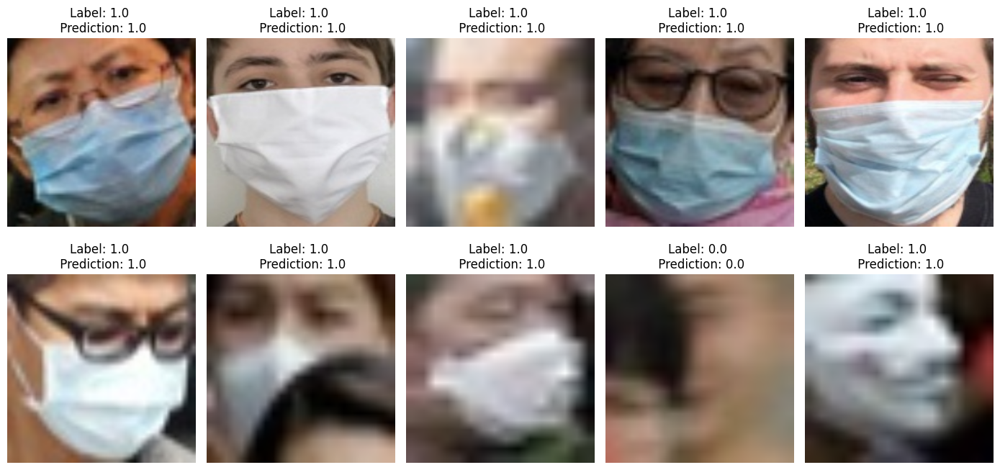

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(X_val_svm_mlp[i])
    ax[i].set_title(f'Label: {y_val_svm_mlp[i]} \n Prediction: {hog_mlp_y_val_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

## Test

In [ ]:
# Predict labels
hog_mlp_y_test_pred = hog_mlp_classifier.predict(hog_features_test_array)

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {hog_mlp_classifier}:
      {metrics.classification_report(y_test, hog_mlp_y_test_pred)}\n""")

Classification report for classifier MLPClassifier(early_stopping=True, hidden_layer_sizes=(50,),
              learning_rate_init=0.1, random_state=42, solver='sgd',
              verbose=True):
                    precision    recall  f1-score   support

         0.0       0.54      0.29      0.38        51
         1.0       0.88      0.96      0.92       388
         2.0       0.20      0.05      0.08        19

    accuracy                           0.85       458
   macro avg       0.54      0.44      0.46       458
weighted avg       0.81      0.85      0.82       458




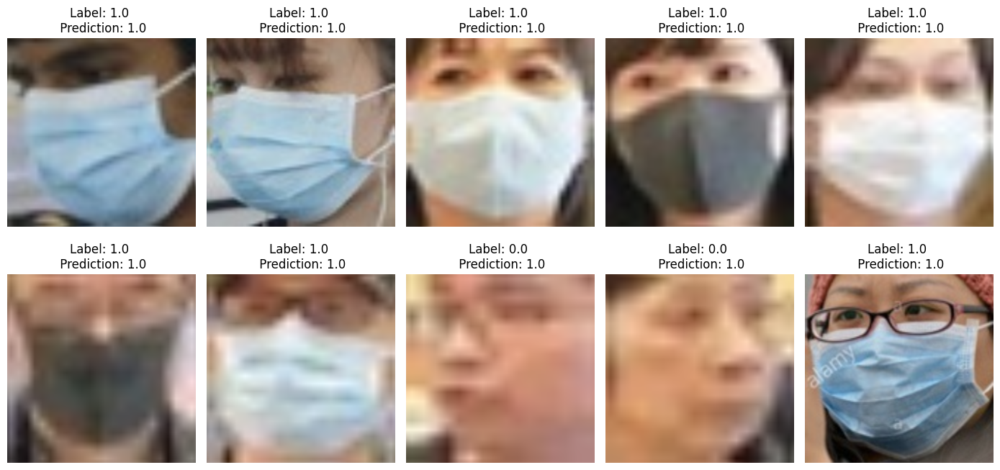

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(resized_X_test_hogsvm[i])
    ax[i].set_title(f'Label: {y_test[i]} \n Prediction: {hog_mlp_y_test_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

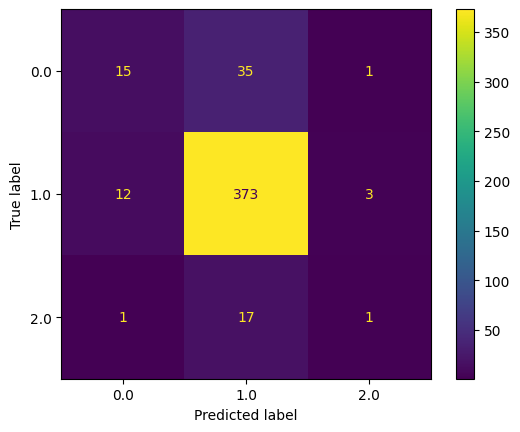

In [ ]:
# Show the confusion matrix
metrics.ConfusionMatrixDisplay.from_predictions(y_test, hog_mlp_y_test_pred)
plt.show()

## Hyperparameter tuning: Grid search

### Parameters: hidden units / activation function / optimizer

In [ ]:
# Set the timer
start_time = time.time()

# Create the SVM model for grid search
gridsearch_mlp = MLPClassifier(hidden_layer_sizes=(50,), alpha=1e-4,
                    solver='sgd', verbose=True, random_state=42,
                    learning_rate_init=.1,
                    early_stopping=True)

# Perform grid search with cross-validation to tune hyperparameters
param_grid = {
    'hidden_layer_sizes': [(50,), (100,)],
    'activation': ['relu', 'tanh'],
    'solver': ['sgd', 'adam']
    }

for hidden_layer_sizes, activation, solver in itertools.product(param_grid['hidden_layer_sizes'], param_grid['activation'], param_grid['solver']):
    print(f"Training model with hidden_layer_sizes: {hidden_layer_sizes}, activation: {activation}, solver: {solver}")
    grid_search_mlp = GridSearchCV(gridsearch_mlp, param_grid=param_grid, cv=3, scoring='accuracy')
    grid_search_mlp.fit(train_hog_features_array, hog_y_train_list)

# Get the best parameters and best accuracy
best_params = grid_search_mlp.best_params_
best_accuracy = grid_search_mlp.best_score_

# End the timer
end_time = time.time()

# Calculate the elapsed time
elapsed_gridsearch = end_time - start_time

print("Best Parameters:", best_params)
print("Best Accuracy:", best_accuracy)
print(f"Elapsed grid search time: {elapsed_gridsearch}")

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
Iteration 11, loss = 0.60058817
Validation score: 0.859375
Iteration 12, loss = 0.59964674
Validation score: 0.859375
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 14.11157220
Validation score: 0.867188
Iteration 2, loss = 11.37932006
Validation score: 0.867188
Iteration 3, loss = 3.22917301
Validation score: 0.867188
Iteration 4, loss = 0.54300376
Validation score: 0.867188
Iteration 5, loss = 0.50140400
Validation score: 0.867188
Iteration 6, loss = 0.48157727
Validation score: 0.867188
Iteration 7, loss = 0.47053995
Validation score: 0.867188
Iteration 8, loss = 0.46255460
Validation score: 0.867188
Iteration 9, loss = 0.44023060
Validation score: 0.867188
Iteration 10, loss = 0.41705090
Validation score: 0.867188
Iteration 11, loss = 0.39492884
Validation score: 0.867188
Iteration 12, loss = 0.38017772
Validation score: 0.867188
Validation score did not improve more than tol=0.000

### Parameters: regularisation alpha / learning rate / momentum

In [ ]:
# Set the timer
start_time = time.time()

# Create the SVM model for grid search
revised_gridsearch_mlp = MLPClassifier(hidden_layer_sizes=(100,), activation='relu', alpha=1e-4,
                    solver='sgd', verbose=True, random_state=42,
                    learning_rate_init=.1,
                    early_stopping=True)

# Perform grid search with cross-validation to tune hyperparameters
param_grid = {
    'alpha': [0.0001, 0.001, 0.01, 0.1],
    'learning_rate_init': [0.001, 0.01, 0.1],
    'momentum': [0.9, 0.5, 0.1]
    }

for alpha, learning_rate_init, momentum in itertools.product( param_grid['alpha'], param_grid['learning_rate_init'], param_grid['momentum']):
    print(f"Training model with alpha: {alpha}, learning_rate_init: {learning_rate_init}, momentum: {momentum}")
    revised_grid_search_mlp = GridSearchCV(revised_gridsearch_mlp, param_grid=param_grid, cv=3, scoring='accuracy')
    revised_grid_search_mlp.fit(train_hog_features_array, hog_y_train_list)

# Get the best parameters and best accuracy
best_params = revised_grid_search_mlp.best_params_
best_accuracy = revised_grid_search_mlp.best_score_

# End the timer
end_time = time.time()

# Calculate the elapsed time
elapsed_gridsearch = end_time - start_time

print("Best Parameters:", best_params)
print("Best Accuracy:", best_accuracy)
print(f"Elapsed grid search time: {elapsed_gridsearch}")

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
Validation score: 0.867188
Validation score did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Iteration 1, loss = 0.84923773
Validation score: 0.820312
Iteration 2, loss = 0.62233241
Validation score: 0.820312
Iteration 3, loss = 0.60011159
Validation score: 0.820312
Iteration 4, loss = 0.56232693
Validation score: 0.820312
Iteration 5, loss = 0.53270002
Validation score: 0.820312
Iteration 6, loss = 0.51340148
Validation score: 0.820312
Iteration 7, loss = 0.49035525
Validation score: 0.820312
Iteration 8, loss = 0.46984780
Validation score: 0.820312
Iteration 9, loss = 0.45220107
Validation score: 0.820312
Iteration 10, loss = 0.43814718
Validation score: 0.843750
Iteration 11, loss = 0.41737954
Validation score: 0.843750
Iteration 12, loss = 0.40204147
Validation score: 0.843750
Iteration 13, loss = 0.38655278
Validation score: 0.851562
Iteration 14, loss = 0.37548430
Validation score: 0.851562
Iteration 15, loss = 0.3619

## Training the revised MLP model

In [ ]:
# Set the timer
start_time = time.time()

# Create the revised Multilayer Perceptrons model
revised_hog_mlp_classifier = MLPClassifier(hidden_layer_sizes=(100,), activation='relu', alpha=0.01,
                    solver='sgd', verbose=True, random_state=42, momentum=0.9,
                    learning_rate_init=0.1)

# Training
revised_hog_mlp_classifier.fit(train_hog_features_array, hog_y_train_list)

# End the timer
end_time = time.time()

# Calculate training time
elapsed_train_time = end_time- start_time
print(f"elapsed training time: {elapsed_train_time}")

# Define the file path
re_hogmlp_file_path = "/content/drive/MyDrive/CW_Folder_PG/Models/re_hogmlp_model.joblibb"

# Save the trained MLP classifier to disk
dump(revised_hog_mlp_classifier, re_hogmlp_file_path)

Iteration 1, loss = 2.22646051
Iteration 2, loss = 0.54926305
Iteration 3, loss = 0.65063445
Iteration 4, loss = 0.52171130
Iteration 5, loss = 0.53282058
Iteration 6, loss = 0.46216259
Iteration 7, loss = 0.46875075
Iteration 8, loss = 0.39259955
Iteration 9, loss = 0.38340810
Iteration 10, loss = 0.32261483
Iteration 11, loss = 0.42848226
Iteration 12, loss = 0.29812246
Iteration 13, loss = 0.31885722
Iteration 14, loss = 0.38416330
Iteration 15, loss = 0.26468940
Iteration 16, loss = 0.25738529
Iteration 17, loss = 0.48695056
Iteration 18, loss = 0.24011321
Iteration 19, loss = 0.22485233
Iteration 20, loss = 0.36504460
Iteration 21, loss = 0.19370781
Iteration 22, loss = 0.15847762
Iteration 23, loss = 0.16901181
Iteration 24, loss = 0.46086748
Iteration 25, loss = 0.15278382
Iteration 26, loss = 0.13605227
Iteration 27, loss = 0.11675433
Iteration 28, loss = 0.26129992
Iteration 29, loss = 0.23148943
Iteration 30, loss = 0.23421109
Iteration 31, loss = 0.18987988
Iteration 32, los

['/content/drive/MyDrive/CW_Folder_PG/Models/re_hogmlp_model.joblibb']

## Validation

In [ ]:
# Load the revised HOG+MLP model
revised_hog_mlp_classifier = load(re_hogmlp_file_path)

# Evaluate the model using the validation set
hog_mlp_y_val_pred = revised_hog_mlp_classifier.predict(hog_features_val_array)

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {revised_hog_mlp_classifier}:
      {metrics.classification_report(y_val_svm_mlp, hog_mlp_y_val_pred)}\n""")

Classification report for classifier MLPClassifier(alpha=0.01, learning_rate_init=0.1, random_state=42, solver='sgd',
              verbose=True):
                    precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        75
         1.0       0.81      1.00      0.90       388
         2.0       0.00      0.00      0.00        16

    accuracy                           0.81       479
   macro avg       0.27      0.33      0.30       479
weighted avg       0.66      0.81      0.73       479




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Test

In [ ]:
# Predict labels
hog_mlp_y_test_pred = revised_hog_mlp_classifier.predict(hog_features_test_array)

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {revised_hog_mlp_classifier}:
      {metrics.classification_report(y_test, hog_mlp_y_test_pred)}\n""")

Classification report for classifier MLPClassifier(alpha=0.01, learning_rate_init=0.1, random_state=42, solver='sgd',
              verbose=True):
                    precision    recall  f1-score   support

         0.0       0.00      0.00      0.00        51
         1.0       0.85      1.00      0.92       388
         2.0       0.00      0.00      0.00        19

    accuracy                           0.85       458
   macro avg       0.28      0.33      0.31       458
weighted avg       0.72      0.85      0.78       458




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


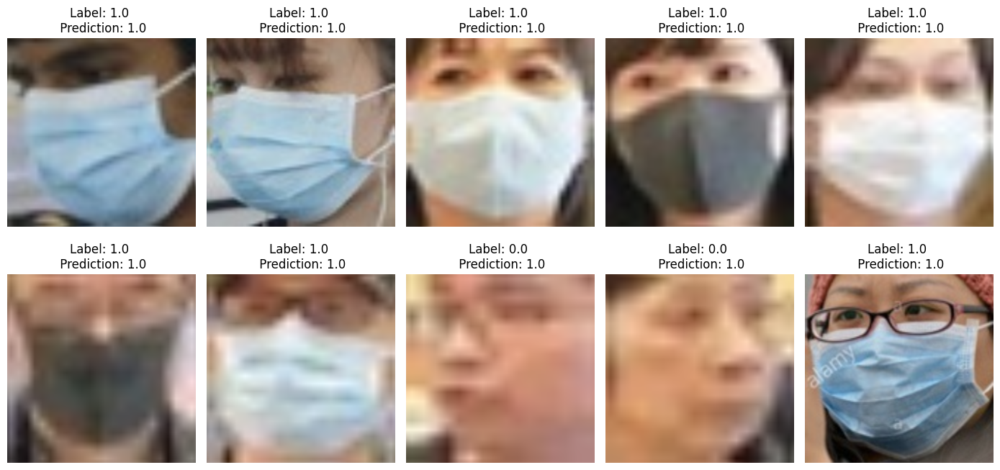

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(resized_X_test_hogsvm[i])
    ax[i].set_title(f'Label: {y_test[i]} \n Prediction: {hog_mlp_y_test_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

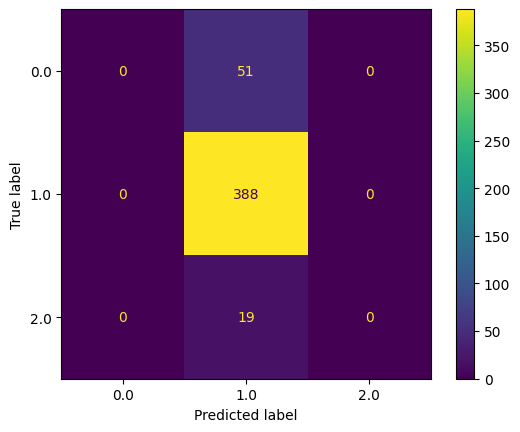

In [ ]:
# Show the confusion matrix
metrics.ConfusionMatrixDisplay.from_predictions(y_test, hog_mlp_y_test_pred)
plt.show()

## MLP (2 hidden layers)

### Train the model with 50 hidden units for each layer

In [ ]:
# This code is derived from the lab tutorial 6
# Create the SVM model with 2 hidden layers
hog_mlp50_classifier = MLPClassifier(hidden_layer_sizes=(50,50), alpha=1e-4,
                    activation='relu',
                    solver='sgd', verbose=True, random_state=42,
                    learning_rate_init=.1,
                    early_stopping=True)

In [ ]:
# Set the timer
start_time = time.time()

# Training
hog_mlp50_classifier.fit(train_hog_features_array, hog_y_train_list)

# End the timer
end_time = time.time()

# Calculate training time
elapsed_train_time = end_time- start_time
print(f"elapsed training time: {elapsed_train_time}")

# Define the file path
hogmlp50_file_path = "/content/drive/MyDrive/CW_Folder_PG/Models/hogmlp50_model.joblibb"

# Save the trained MLP classifier to disk
dump(hog_mlp50_classifier, hogmlp50_file_path)

Iteration 1, loss = 1.16515829
Validation score: 0.802083
Iteration 2, loss = 0.56628913
Validation score: 0.802083
Iteration 3, loss = 0.52591047
Validation score: 0.802083
Iteration 4, loss = 0.51844743
Validation score: 0.802083
Iteration 5, loss = 0.51148369
Validation score: 0.802083
Iteration 6, loss = 0.41964826
Validation score: 0.781250
Iteration 7, loss = 0.37696710
Validation score: 0.802083
Iteration 8, loss = 0.33400720
Validation score: 0.802083
Iteration 9, loss = 0.43640687
Validation score: 0.802083
Iteration 10, loss = 0.32439585
Validation score: 0.807292
Iteration 11, loss = 0.30744455
Validation score: 0.786458
Iteration 12, loss = 0.39124501
Validation score: 0.817708
Iteration 13, loss = 0.26346645
Validation score: 0.630208
Iteration 14, loss = 0.31352583
Validation score: 0.750000
Iteration 15, loss = 0.25489606
Validation score: 0.812500
Iteration 16, loss = 0.26691941
Validation score: 0.843750
Iteration 17, loss = 0.26570659
Validation score: 0.802083
Iterat

['/content/drive/MyDrive/CW_Folder_PG/Models/hogmlp50_model.joblibb']

### Validation

In [ ]:
# Load the 2 hidden layers MLP model
hog_mlp50_classifier = load(hogmlp50_file_path)

# Evaluate the model using the validation set
hog_mlp_y_val_pred = hog_mlp50_classifier.predict(hog_features_val_array)

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {hog_mlp50_classifier}:
      {metrics.classification_report(y_val_svm_mlp, hog_mlp_y_val_pred)}\n""")

Classification report for classifier MLPClassifier(early_stopping=True, hidden_layer_sizes=(50, 50),
              learning_rate_init=0.1, random_state=42, solver='sgd',
              verbose=True):
                    precision    recall  f1-score   support

         0.0       0.53      0.55      0.54        75
         1.0       0.90      0.93      0.91       388
         2.0       0.00      0.00      0.00        16

    accuracy                           0.84       479
   macro avg       0.47      0.49      0.48       479
weighted avg       0.81      0.84      0.82       479




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Test

In [ ]:
# Predict labels
hog_mlp_y_test_pred = hog_mlp50_classifier.predict(hog_features_test_array)

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {hog_mlp50_classifier}:
      {metrics.classification_report(y_test, hog_mlp_y_test_pred)}\n""")

Classification report for classifier MLPClassifier(early_stopping=True, hidden_layer_sizes=(50, 50),
              learning_rate_init=0.1, random_state=42, solver='sgd',
              verbose=True):
                    precision    recall  f1-score   support

         0.0       0.43      0.43      0.43        51
         1.0       0.89      0.93      0.91       388
         2.0       0.00      0.00      0.00        19

    accuracy                           0.84       458
   macro avg       0.44      0.45      0.45       458
weighted avg       0.80      0.84      0.82       458




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


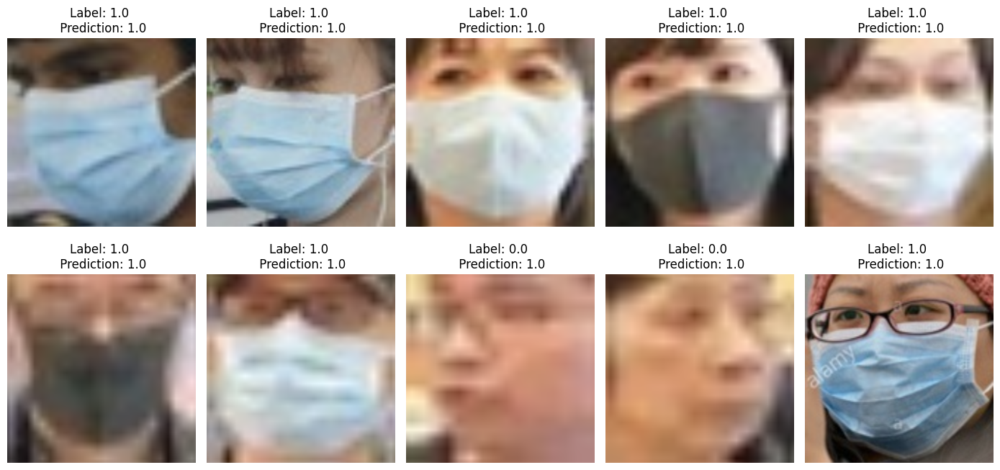

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(resized_X_test_hogsvm[i])
    ax[i].set_title(f'Label: {y_test[i]} \n Prediction: {hog_mlp_y_test_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

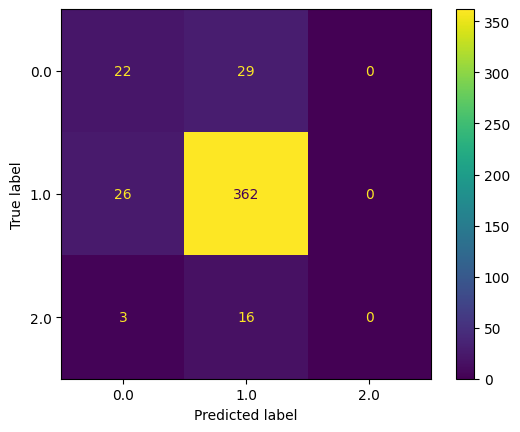

In [ ]:
# Show the confusion matrix
metrics.ConfusionMatrixDisplay.from_predictions(y_test, hog_mlp_y_test_pred)
plt.show()

### Train the model with 100 hidden units for each layer

In [ ]:
# This code is derived from the lab tutorial 6
# Create the SVM model with 2 hidden layers
hog_mlp100_classifier = MLPClassifier(hidden_layer_sizes=(50,50), alpha=1e-4,
                    activation='relu',
                    solver='sgd', verbose=True, random_state=42,
                    learning_rate_init=.1,
                    early_stopping=True)

In [ ]:
# Set the timer
start_time = time.time()

# Training
hog_mlp100_classifier.fit(train_hog_features_array, hog_y_train_list)

# End the timer
end_time = time.time()

# Calculate training time
elapsed_train_time = end_time- start_time
print(f"elapsed training time: {elapsed_train_time}")

# Define the file path
hogmlp100_file_path = "/content/drive/MyDrive/CW_Folder_PG/Models/hogmlp100_model.joblibb"

# Save the trained MLP classifier to disk
dump(hog_mlp100_classifier, hogmlp100_file_path)

Iteration 1, loss = 1.16515829
Validation score: 0.802083
Iteration 2, loss = 0.56628913
Validation score: 0.802083
Iteration 3, loss = 0.52591047
Validation score: 0.802083
Iteration 4, loss = 0.51844743
Validation score: 0.802083
Iteration 5, loss = 0.51148369
Validation score: 0.802083
Iteration 6, loss = 0.41964826
Validation score: 0.781250
Iteration 7, loss = 0.37696710
Validation score: 0.802083
Iteration 8, loss = 0.33400720
Validation score: 0.802083
Iteration 9, loss = 0.43640687
Validation score: 0.802083
Iteration 10, loss = 0.32439585
Validation score: 0.807292
Iteration 11, loss = 0.30744455
Validation score: 0.786458
Iteration 12, loss = 0.39124501
Validation score: 0.817708
Iteration 13, loss = 0.26346645
Validation score: 0.630208
Iteration 14, loss = 0.31352583
Validation score: 0.750000
Iteration 15, loss = 0.25489606
Validation score: 0.812500
Iteration 16, loss = 0.26691941
Validation score: 0.843750
Iteration 17, loss = 0.26570659
Validation score: 0.802083
Iterat

['/content/drive/MyDrive/CW_Folder_PG/Models/hogmlp100_model.joblibb']

### Validation

In [ ]:
# Load the 2 hidden layers MLP model
hog_mlp100_classifier = load(hogmlp100_file_path)

# Evaluate the model using the validation set
hog_mlp_y_val_pred = hog_mlp100_classifier.predict(hog_features_val_array)

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {hog_mlp100_classifier}:
      {metrics.classification_report(y_val_svm_mlp, hog_mlp_y_val_pred)}\n""")

Classification report for classifier MLPClassifier(early_stopping=True, hidden_layer_sizes=(50, 50),
              learning_rate_init=0.1, random_state=42, solver='sgd',
              verbose=True):
                    precision    recall  f1-score   support

         0.0       0.53      0.55      0.54        75
         1.0       0.90      0.93      0.91       388
         2.0       0.00      0.00      0.00        16

    accuracy                           0.84       479
   macro avg       0.47      0.49      0.48       479
weighted avg       0.81      0.84      0.82       479




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Test

In [ ]:
# Predict labels
hog_mlp_y_test_pred = hog_mlp100_classifier.predict(hog_features_test_array)

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {hog_mlp100_classifier}:
      {metrics.classification_report(y_test, hog_mlp_y_test_pred)}\n""")

Classification report for classifier MLPClassifier(early_stopping=True, hidden_layer_sizes=(50, 50),
              learning_rate_init=0.1, random_state=42, solver='sgd',
              verbose=True):
                    precision    recall  f1-score   support

         0.0       0.43      0.43      0.43        51
         1.0       0.89      0.93      0.91       388
         2.0       0.00      0.00      0.00        19

    accuracy                           0.84       458
   macro avg       0.44      0.45      0.45       458
weighted avg       0.80      0.84      0.82       458




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


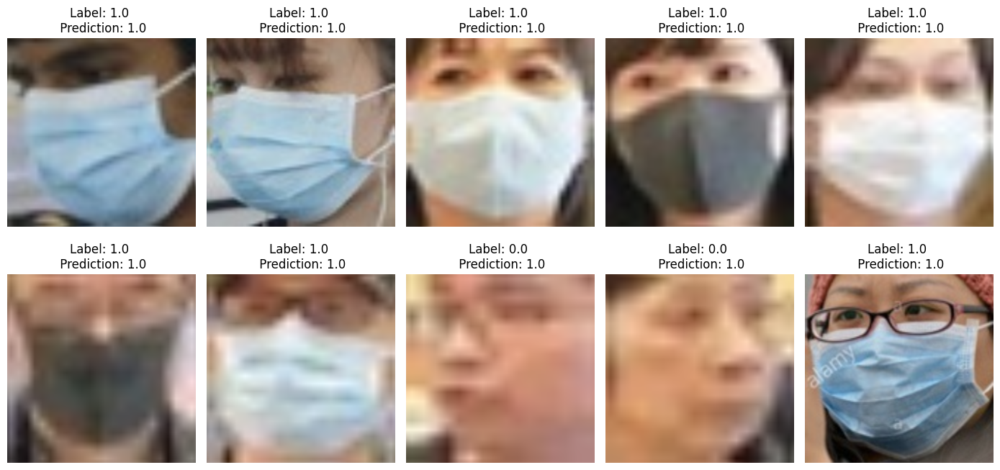

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(resized_X_test_hogsvm[i])
    ax[i].set_title(f'Label: {y_test[i]} \n Prediction: {hog_mlp_y_test_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

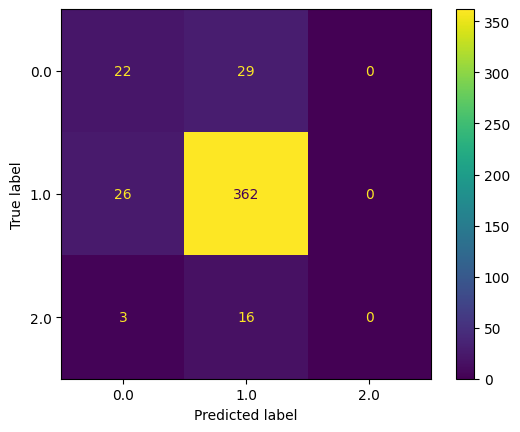

In [ ]:
# Show the confusion matrix
metrics.ConfusionMatrixDisplay.from_predictions(y_test, hog_mlp_y_test_pred)
plt.show()

## Hyperparameter tuning: Grid search

### Parameters: (2 hidden layers) hidden units

**ReLU for activation function and SGD for loss function will be used for the MLP model with 2 hidden layers.**

In [ ]:
# Set the timer
start_time = time.time()

# Create the SVM model for grid search
gridsearch_mlp2 = MLPClassifier(hidden_layer_sizes=(50,50), alpha=1e-4,
                    activation='relu',
                    solver='sgd', verbose=True, random_state=42,
                    learning_rate_init=.1,
                    early_stopping=True)

# Perform grid search with cross-validation to tune hyperparameters
param_grid = {
    'hidden_layer_sizes': [(50,50), (100,100)]
    }

for hidden_layer_sizes in itertools.product(param_grid['hidden_layer_sizes']):
    print(f"Training model with hidden_layer_sizes: {hidden_layer_sizes}")
    grid_search_mlp2 = GridSearchCV(gridsearch_mlp2, param_grid=param_grid, cv=3, scoring='accuracy')
    grid_search_mlp2.fit(train_hog_features_array, hog_y_train_list)

# Get the best parameters and best accuracy
best_params = grid_search_mlp2.best_params_
best_accuracy = grid_search_mlp2.best_score_

# End the timer
end_time = time.time()

# Calculate the elapsed time
elapsed_gridsearch = end_time - start_time

print("Best Parameters:", best_params)
print("Best Accuracy:", best_accuracy)
print(f"Elapsed grid search time: {elapsed_gridsearch}")

Training model with hidden_layer_sizes: ((50, 50),)
Iteration 1, loss = 1.32139347
Validation score: 0.781250
Iteration 2, loss = 0.71094793
Validation score: 0.781250
Iteration 3, loss = 0.55780573
Validation score: 0.781250
Iteration 4, loss = 0.55754199
Validation score: 0.781250
Iteration 5, loss = 0.51469319
Validation score: 0.781250
Iteration 6, loss = 0.56805405
Validation score: 0.335938
Iteration 7, loss = 0.59939387
Validation score: 0.781250
Iteration 8, loss = 0.63874270
Validation score: 0.781250
Iteration 9, loss = 0.45346620
Validation score: 0.781250
Iteration 10, loss = 0.56016757
Validation score: 0.781250
Iteration 11, loss = 0.40977692
Validation score: 0.781250
Iteration 12, loss = 0.34308614
Validation score: 0.828125
Iteration 13, loss = 0.51200158
Validation score: 0.492188
Iteration 14, loss = 0.43313554
Validation score: 0.781250
Iteration 15, loss = 0.34300550
Validation score: 0.781250
Iteration 16, loss = 0.30144332
Validation score: 0.859375
Iteration 17,

### Parameters: (2 hidden layers) regularisation alpha / learning rate

In [ ]:
# Set the timer
start_time = time.time()

# Create the SVM model for grid search
gridsearch_mlp2 = MLPClassifier(hidden_layer_sizes=(100,100), alpha=1e-4,
                    activation='relu',
                    solver='sgd', verbose=True, random_state=42,
                    learning_rate_init=.1,
                    early_stopping=True)

# Perform grid search with cross-validation to tune hyperparameters
param_grid = {
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate_init': [0.001, 0.01, 0.1],
    }

for alpha, learning_rate_init in itertools.product(param_grid['alpha'], param_grid['learning_rate_init']):
    print(f"Training model with alpha: {alpha}, learning_rate_init: {learning_rate_init}")
    grid_search_mlp2 = GridSearchCV(gridsearch_mlp2, param_grid=param_grid, cv=3, scoring='accuracy')
    grid_search_mlp2.fit(train_hog_features_array, hog_y_train_list)

# Get the best parameters and best accuracy
best_params = grid_search_mlp2.best_params_
best_accuracy = grid_search_mlp2.best_score_

# End the timer
end_time = time.time()

# Calculate the elapsed time
elapsed_gridsearch = end_time - start_time

print("Best Parameters:", best_params)
print("Best Accuracy:", best_accuracy)
print(f"Elapsed grid search time: {elapsed_gridsearch}")

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
Validation score: 0.750000
Iteration 6, loss = 0.49647455
Validation score: 0.750000
Iteration 7, loss = 0.48993266
Validation score: 0.757812
Iteration 8, loss = 0.62315229
Validation score: 0.750000
Iteration 9, loss = 0.47361619
Validation score: 0.757812
Iteration 10, loss = 0.80910858
Validation score: 0.750000
Iteration 11, loss = 0.61823746
Validation score: 0.750000
Iteration 12, loss = 0.54415672
Validation score: 0.750000
Iteration 13, loss = 0.51995392
Validation score: 0.750000
Iteration 14, loss = 0.45120118
Validation score: 0.750000
Iteration 15, loss = 0.46704700
Validation score: 0.750000
Iteration 16, loss = 0.34802741
Validation score: 0.820312
Iteration 17, loss = 0.32996633
Validation score: 0.804688
Iteration 18, loss = 0.42467438
Validation score: 0.835938
Iteration 19, loss = 0.29291887
Validation score: 0.820312
Iteration 20, loss = 0.31074804
Validation score: 0.804688
Iteration 21, loss = 0.32020839
Validation score: 0.8359

### Parameters: (2 hidden layers) momentum

In [ ]:
# Set the timer
start_time = time.time()

# Create the SVM model for grid search
gridsearch_mlp2 = MLPClassifier(hidden_layer_sizes=(100,100), alpha=0.01,
                    activation='relu',
                    solver='sgd', verbose=True, random_state=42,
                    learning_rate_init=0.1,
                    early_stopping=True)

# Perform grid search with cross-validation to tune hyperparameters
param_grid = {
    'momentum': [0.9, 0.5, 0.1]
    }

for momentum in itertools.product(param_grid['momentum']):
    print(f"Training model with alpha: {momentum}")
    grid_search_mlp2 = GridSearchCV(gridsearch_mlp2, param_grid=param_grid, cv=3, scoring='accuracy')
    grid_search_mlp2.fit(train_hog_features_array, hog_y_train_list)

# Get the best parameters and best accuracy
best_params = grid_search_mlp2.best_params_
best_accuracy = grid_search_mlp2.best_score_

# End the timer
end_time = time.time()

# Calculate the elapsed time
elapsed_gridsearch = end_time - start_time

print("Best Parameters:", best_params)
print("Best Accuracy:", best_accuracy)
print(f"Elapsed grid search time: {elapsed_gridsearch}")

Training model with alpha: (0.9,)
Iteration 1, loss = 1.50474894
Validation score: 0.750000
Iteration 2, loss = 0.60264178
Validation score: 0.750000
Iteration 3, loss = 0.58324916
Validation score: 0.750000
Iteration 4, loss = 0.55951820
Validation score: 0.750000
Iteration 5, loss = 0.55668650
Validation score: 0.750000
Iteration 6, loss = 0.49647455
Validation score: 0.750000
Iteration 7, loss = 0.48993266
Validation score: 0.757812
Iteration 8, loss = 0.62315229
Validation score: 0.750000
Iteration 9, loss = 0.47361619
Validation score: 0.757812
Iteration 10, loss = 0.80910858
Validation score: 0.750000
Iteration 11, loss = 0.61823746
Validation score: 0.750000
Iteration 12, loss = 0.54415672
Validation score: 0.750000
Iteration 13, loss = 0.51995392
Validation score: 0.750000
Iteration 14, loss = 0.45120118
Validation score: 0.750000
Iteration 15, loss = 0.46704700
Validation score: 0.750000
Iteration 16, loss = 0.34802741
Validation score: 0.820312
Iteration 17, loss = 0.32996633

## Training the revised MLP model (2 hidden layers)

In [ ]:
# Set the timer
start_time = time.time()

# Create the revised Multilayer Perceptrons model
re_hog_mlp100_classifier = MLPClassifier(hidden_layer_sizes=(100, 100), activation='relu', alpha=0.01,
                    solver='sgd', verbose=True, random_state=42, momentum=0.9,
                    learning_rate_init=0.1)

re_hog_mlp100_classifier.fit(train_hog_features_array, hog_y_train_list)

# End the timer
end_time = time.time()

# Calculate training time
elapsed_train_time = end_time- start_time
print(f"elapsed training time: {elapsed_train_time}")

# Define the file path
re_hogmlp100_file_path = "/content/drive/MyDrive/CW_Folder_PG/Models/re_hogmlp100_model.joblibb"

# Save the trained MLP classifier to disk
dump(re_hog_mlp100_classifier, re_hogmlp100_file_path)

Iteration 1, loss = 1.12354080
Iteration 2, loss = 0.57421512
Iteration 3, loss = 0.55343634
Iteration 4, loss = 0.49123041
Iteration 5, loss = 0.44375921
Iteration 6, loss = 0.73759536
Iteration 7, loss = 0.54877761
Iteration 8, loss = 0.53171723
Iteration 9, loss = 0.52049677
Iteration 10, loss = 0.53820256
Iteration 11, loss = 0.40131670
Iteration 12, loss = 0.50004682
Iteration 13, loss = 0.48900254
Iteration 14, loss = 0.35489389
Iteration 15, loss = 0.36051140
Iteration 16, loss = 0.30627812
Iteration 17, loss = 0.37392503
Iteration 18, loss = 0.26593152
Iteration 19, loss = 0.24816411
Iteration 20, loss = 1.28226009
Iteration 21, loss = 0.44094598
Iteration 22, loss = 0.86388080
Iteration 23, loss = 0.60223596
Iteration 24, loss = 0.51698994
Iteration 25, loss = 0.54864286
Iteration 26, loss = 0.61455453
Iteration 27, loss = 0.59943596
Iteration 28, loss = 0.59468640
Iteration 29, loss = 0.59359509
Iteration 30, loss = 0.59316930
Training loss did not improve more than tol=0.000

['/content/drive/MyDrive/CW_Folder_PG/Models/re_hogmlp100_model.joblibb']

## Validation

In [ ]:
# Load the 2 hidden layers MLP model
re_hog_mlp100_classifier = load(hogmlp100_file_path)

# Evaluate the model using the validation set
hog_mlp2_y_val_pred = re_hog_mlp100_classifier.predict(hog_features_val_array)

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {re_hog_mlp100_classifier}:
      {metrics.classification_report(y_val_svm_mlp, hog_mlp2_y_val_pred)}\n""")

Classification report for classifier MLPClassifier(early_stopping=True, hidden_layer_sizes=(50, 50),
              learning_rate_init=0.1, random_state=42, solver='sgd',
              verbose=True):
                    precision    recall  f1-score   support

         0.0       0.53      0.55      0.54        75
         1.0       0.90      0.93      0.91       388
         2.0       0.00      0.00      0.00        16

    accuracy                           0.84       479
   macro avg       0.47      0.49      0.48       479
weighted avg       0.81      0.84      0.82       479




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## Test

In [ ]:
# Predict labels
hog_mlp2_y_test_pred = re_hog_mlp100_classifier.predict(hog_features_test_array)

In [ ]:
# Check the evaluation metrics
print(f"""Classification report for classifier {re_hog_mlp100_classifier}:
      {metrics.classification_report(y_test, hog_mlp2_y_test_pred)}\n""")

Classification report for classifier MLPClassifier(early_stopping=True, hidden_layer_sizes=(50, 50),
              learning_rate_init=0.1, random_state=42, solver='sgd',
              verbose=True):
                    precision    recall  f1-score   support

         0.0       0.43      0.43      0.43        51
         1.0       0.89      0.93      0.91       388
         2.0       0.00      0.00      0.00        19

    accuracy                           0.84       458
   macro avg       0.44      0.45      0.45       458
weighted avg       0.80      0.84      0.82       458




/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


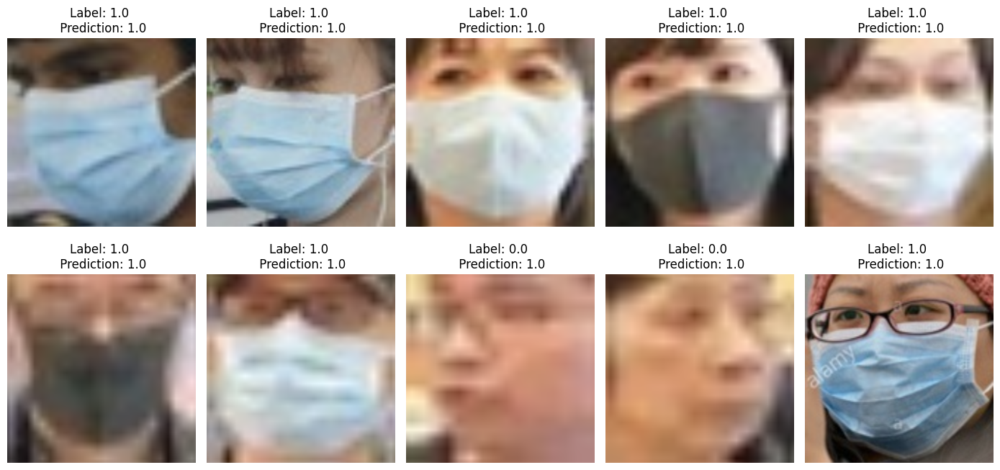

In [ ]:
# Plot the predictions
fig, axes = plt.subplots(2, 5, figsize=(14, 7), sharex=True, sharey=True)
ax = axes.ravel()

for i in range(10):
    ax[i].imshow(resized_X_test_hogsvm[i])
    ax[i].set_title(f'Label: {y_test[i]} \n Prediction: {hog_mlp2_y_test_pred[i]}')
    ax[i].set_axis_off()
fig.tight_layout()
plt.show()

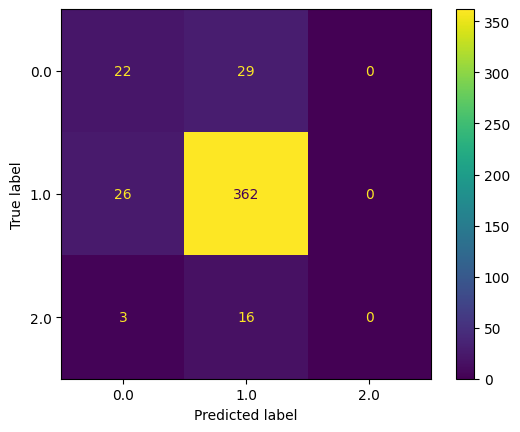

In [ ]:
# Show the confusion matrix
metrics.ConfusionMatrixDisplay.from_predictions(y_test, hog_mlp2_y_test_pred)
plt.show()

# CNN model

## Data augmentation

In [ ]:
# Check the length of resized X train with inter area interpolation
print(len(resized_X_train_linear_array))
print(resized_X_train_linear_array.shape)

2394
(2394, 256, 256, 3)


In [14]:
# Change y_train(list) to numpy array
y_train_array = np.array(y_train)
# Check the length of y train array
print(len(y_train_array))

2394


In [ ]:
# Check the data type of X_train and y_train
print(resized_X_train_linear_array[0].dtype)
print(y_train_array[0].dtype)

uint8
float64


In [15]:
# Change the data type of the resized training set to float
from skimage import img_as_float

resized_X_train_float = img_as_float(resized_X_train_linear_array)

In [ ]:
# Check the data type
print(resized_X_train_float[0].dtype)

float64


In [ ]:
# Check the minimum and maximum data in the resized training image for normalisation
print("Min data:", np.min(resized_X_train_float))
print("Max data:", np.max(resized_X_train_float))

Min data: 0.0
Max data: 1.0


### Check the average and standard deviation of each channel

In [16]:
# Get the mean and standard deviation for each channel
red_channel_mean = np.mean(resized_X_train_float[:,:,0])
green_channel_mean = np.mean(resized_X_train_float[:,:,1])
blue_channel_mean = np.mean(resized_X_train_float[:,:,2])

red_channel_std = np.std(resized_X_train_float[:,:,0])
green_channel_std = np.std(resized_X_train_float[:,:,1])
blue_channel_std = np.std(resized_X_train_float[:,:,2])

print("Red channel:")
print("Mean pixel intensity:", red_channel_mean)
print("Standard deviation:", red_channel_std)

print("\nGreen channel:")
print("Mean pixel intensity:", green_channel_mean)
print("Standard deviation:", green_channel_std)

print("\nBlue channel:")
print("Mean pixel intensity:", blue_channel_mean)
print("Standard deviation:", blue_channel_std)

Red channel:
Mean pixel intensity: 0.36299883653510134
Standard deviation: 0.24927111512346373

Green channel:
Mean pixel intensity: 0.36304594419395436
Standard deviation: 0.2490955487746713

Blue channel:
Mean pixel intensity: 0.3634441666530159
Standard deviation: 0.24876357842700308


In [17]:
# Store the values to lists
train_means = [red_channel_mean, green_channel_mean, blue_channel_std]
train_stds = [red_channel_std, green_channel_std, blue_channel_std]

### Define the transformation

In [18]:
# Import the library
from torchvision import transforms

# Data augmentation and normalization for training
train_transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(256),
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(degrees=(0, 180)),
        transforms.ColorJitter(brightness=0.5, hue=0.3),
        transforms.ToTensor(),
        transforms.Normalize(train_means, train_stds)
        ])

# Data augmentation and normalization for validation
val_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(train_means, train_stds)
    ])

# Data augmentation and normalization for test set
test_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(train_means, train_stds)
    ])

## Define datasets: train, validation and test sets

In [19]:
# Define a class to make each dataset
from torch.utils.data import Dataset

class CNN_dataset(Dataset):
    def __init__(self, X, y, transform=None):
        self.X = X
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        X = self.X[idx]
        y = self.y[idx]

        if self.transform:
            X = self.transform(X)

        return X, y

In [20]:
# Import the library
from sklearn.model_selection import train_test_split

# Split the previous training set into 80% for training and 20% for validation
X_train_cnn, X_val_cnn, y_train_cnn, y_val_cnn = train_test_split(resized_X_train_float, y_train_array, test_size=0.2, random_state=42)

In [21]:
# Make datasets
train_dataset = CNN_dataset(X_train_cnn, y_train_cnn, transform=train_transform)
val_dataset = CNN_dataset(X_val_cnn, y_val_cnn, transform=val_transform)
test_dataset = CNN_dataset(X_test, y_test, transform=test_transform)

In [ ]:
# Check each element
print(train_dataset[0])
print(val_dataset[0])
print(test_dataset[0])

(tensor([[[ 0.1148,  0.1148,  0.1148,  ...,  0.8027,  0.8027,  0.8027],
          [ 0.1148,  0.1148,  0.1148,  ...,  0.8027,  0.8027,  0.8027],
          [ 0.1148,  0.1148,  0.1148,  ...,  0.8027,  0.8027,  0.8027],
          ...,
          [-0.3385, -0.3385, -0.3385,  ..., -0.0571, -0.0571, -0.0571],
          [-0.3385, -0.3385, -0.3385,  ..., -0.0571, -0.0571, -0.0571],
          [-0.3385, -0.3385, -0.3385,  ..., -0.0571, -0.0571, -0.0571]],
 
         [[-0.2603, -0.2603, -0.2603,  ...,  0.3808,  0.3808,  0.3808],
          [-0.2603, -0.2603, -0.2603,  ...,  0.3808,  0.3808,  0.3808],
          [-0.2603, -0.2603, -0.2603,  ...,  0.3808,  0.3808,  0.3808],
          ...,
          [-0.5887, -0.5887, -0.5887,  ..., -0.3228, -0.3228, -0.3228],
          [-0.5887, -0.5887, -0.5887,  ..., -0.3072, -0.3072, -0.3072],
          [-0.5887, -0.5887, -0.5887,  ..., -0.3072, -0.3072, -0.3072]],
 
         [[ 0.0170,  0.0170,  0.0170,  ...,  0.5176,  0.5176,  0.5176],
          [ 0.0170,  0.0170,

In [ ]:
# Check the shape of X train after data augmentation
X_train_cnn, y_train_cnn = train_dataset[0]
print(f"Shape of a training sample: {X_train_cnn.shape}")

# Check the shape of X validation after data augmentation
X_val_cnn, y_val_cnn = val_dataset[0]
print(f"Shape of a validation sample: {X_val_cnn.shape}")

# Check the shape of X test after data augmentation
X_test_cnn, y_test_cnn = test_dataset[0]
print(f"Shape of a test sample: {X_test_cnn.shape}")

Shape of a training sample: torch.Size([3, 224, 224])
Shape of a validation sample: torch.Size([3, 224, 224])
Shape of a test sample: torch.Size([3, 224, 224])


In [22]:
# Set a dataloader for each dataset
# Bach size is random
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [ ]:
# Check the size using batch
print(f'Training set size: {len(train_loader)}')
print(f'Validation set size: {len(val_loader)}')
print(f'Test set size: {len(test_loader)}')

Training set size: 60
Validation set size: 60
Test set size: 15


## Pre-trained CNN model (Resnet34)

In [23]:
# Import the library
import torchvision.models as models

# Load the pretrained ResNet34 model
resnet34_classifier = models.resnet34(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:01<00:00, 58.4MB/s]


In [24]:
# Change the output size
num_classes = 3
resnet34_classifier.fc = nn.Linear(resnet34_classifier.fc.in_features, num_classes)

In [25]:
# Define the structure of the pre-trained model
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(resnet34_classifier.parameters(), lr=0.0001)

In [26]:
# Free up GPU memory
torch.cuda.empty_cache()

### Train the Resnet34

In [27]:
# Define a function for training the model
def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=100, save_path='/content/drive/MyDrive/CW_Folder_PG/Models/pretrained_resnet32_model.pth'):
    # Set the timer
    start_time = time.time()

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = model.to(device)

    best_acc = 0.0
    best_model_wts = None

    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}")
        print('----------------')
        running_train_loss = 0.0
        running_train_corrects = 0

        # Training
        model.train()
        for inputs, labels in train_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels.long())  # Convert labels to long tensors
            loss.backward()
            optimizer.step()

            running_train_loss += loss.item() * inputs.size(0)
            running_train_corrects += torch.sum(preds == labels.data)

        # Calculate training loss and accuracy
        train_loss = running_train_loss / len(train_loader.dataset)
        train_acc = running_train_corrects.double() / len(train_loader.dataset)
        print(f'Train Loss: {train_loss:.4f} Acc: {train_acc:.4f}')

        # Validation
        model.eval()
        running_val_loss = 0.0
        running_val_corrects = 0

        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels.long())

                running_val_loss += loss.item() * inputs.size(0)
                running_val_corrects += torch.sum(preds == labels.data)

        # Calculate validation loss and accuracy
        val_loss = running_val_loss / len(val_loader.dataset)
        val_acc = running_val_corrects.double() / len(val_loader.dataset)
        print(f'Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}')

        # Save the best model based on the best validation accuracy
        if val_acc > best_acc:
            best_acc = val_acc
            best_model_wts = model.state_dict()

    # End the timer
    end_time = time.time()

    # Calculate training time
    elapsed_train_time = end_time- start_time
    print(f"elapsed training time: {elapsed_train_time}")

    # Save the best model
    torch.save(best_model_wts, save_path)
    print(f'Best model saved at {save_path}')

    print("Training completed")
    return model

In [28]:
train_model(resnet34_classifier, criterion, optimizer, train_loader, val_loader, num_epochs=100)

Epoch 1
----------------
Train Loss: 0.5512 Acc: 0.7744
Val Loss: 0.3526 Acc: 0.8867
Epoch 2
----------------
Train Loss: 0.3351 Acc: 0.8841
Val Loss: 0.3020 Acc: 0.9008
Epoch 3
----------------
Train Loss: 0.3183 Acc: 0.8914
Val Loss: 0.3137 Acc: 0.8851
Epoch 4
----------------
Train Loss: 0.3011 Acc: 0.8992
Val Loss: 0.2591 Acc: 0.9185
Epoch 5
----------------
Train Loss: 0.3033 Acc: 0.8997
Val Loss: 0.2479 Acc: 0.9154
Epoch 6
----------------
Train Loss: 0.2803 Acc: 0.9065
Val Loss: 0.2441 Acc: 0.9159
Epoch 7
----------------
Train Loss: 0.2730 Acc: 0.9008
Val Loss: 0.2238 Acc: 0.9253
Epoch 8
----------------
Train Loss: 0.2467 Acc: 0.9191
Val Loss: 0.2342 Acc: 0.9185
Epoch 9
----------------
Train Loss: 0.2408 Acc: 0.9185
Val Loss: 0.2327 Acc: 0.9196
Epoch 10
----------------
Train Loss: 0.2367 Acc: 0.9243
Val Loss: 0.2333 Acc: 0.9206
Epoch 11
----------------
Train Loss: 0.2448 Acc: 0.9201
Val Loss: 0.2172 Acc: 0.9285
Epoch 12
----------------
Train Loss: 0.2385 Acc: 0.9227
Val Lo

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
# Check the model type
print(type(resnet34_classifier))

<class 'torchvision.models.resnet.ResNet'>


### Test the model

In [29]:
# Define the architecture of the model
num_classes = 3

# Reconstruct the model structure
model = models.resnet34(pretrained=False)
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Specify the path to the saved model
saved_model_path = '/content/drive/MyDrive/CW_Folder_PG/Models/pretrained_resnet32_model.pth'

# Load the saved model state and make sure it will run in CPU
state_dict = torch.load(saved_model_path, map_location=torch.device('cpu'))

# Load the saved state dictionary into the model
model.load_state_dict(state_dict)

# Ensure the model on test mode
model.eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [30]:
# Define the function for testing
def test_model(model, test_loader):
    model.eval()  # Set the model to test mode

    all_preds = []
    all_labels = []

    running_corrects = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in test_loader:
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            total += labels.size(0)
            running_corrects += torch.sum(preds == labels.data)

    accuracy = running_corrects.double() / total
    print(f'Test Accuracy: {accuracy:.4f}')

    metrics.ConfusionMatrixDisplay.from_predictions(all_preds, all_labels)
    plt.show()

    # return all_preds, all_labels

Test Accuracy: 0.9585


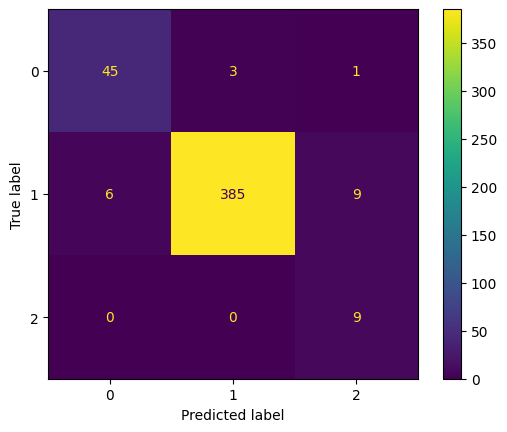

In [31]:
# Test the model
test_model(model, test_loader)